# Group 13 Project Data Analysis

In [1]:
import sys
sys.path.append("/scratch/group/csce435-f23/python-3.8.17/lib/python3.8/site-packages")
sys.path.append("/scratch/group/csce435-f23/thicket")
from glob import glob

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import math
import os

import thicket as th

pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)

Read in all Cali files from the "./Cali" folder

In [2]:
def read_cali_files(folder):
    file_pattern = os.path.join(folder, "*.cali")
    files = glob(file_pattern)
    if not files:
        return None
    return th.Thicket.from_caliperreader(files)

algorithms = [f for f in os.listdir("./Cali") if os.path.isdir(os.path.join("./Cali", f))]

cali_dict = {}
for folder in algorithms:
    path = os.path.join("./Cali", folder)
    thicket = read_cali_files(path)
    if thicket is not None:
        cali_dict[folder] = thicket

Merge the dataframe and metadata

In [3]:
merged_df_dict = {}
for folder, tk in cali_dict.items():
    merged_df = pd.merge(tk.dataframe, tk.metadata, left_on='profile', right_index=True)
    merged_df_dict[folder] = merged_df

Strong Scaling Plot Definition

In [34]:
def plot_strong_scaling(merged_df, input_size, model, region, algorithm):
    plt.figure(figsize=(10, 6))
    exponent = int(math.log2(input_size))

    for input_type in merged_df['InputType'].unique():
        type_df = merged_df[(merged_df['ProgrammingModel'] == model) &
                            (merged_df['InputSize'] == input_size) &
                            (merged_df['name'] == region) &
                            (merged_df['InputType'] == input_type)]

        x = 'num_procs' if model == 'MPI' else 'num_threads'
        xLabel = 'Number of Processors' if model == 'MPI' else 'Number of Threads'
        timeLabel = ''
        if model == 'MPI':
            timeLabel = 'Avg time/rank'
        else:
            if algorithm == 'Bitonic':
                timeLabel = 'Avg GPU Time/rank'
            else:
                timeLabel = 'Avg GPU time/rank'

        grouped = type_df.groupby(x)[timeLabel].mean()
        if not grouped.empty:
            plt.plot(grouped.index, grouped.values, label=f'{input_type}')

    plt.xscale('log', base=2)
    plt.xlabel(xLabel)
    plt.yscale('log', base=10)
    plt.ylabel('Average Time (s)')
    plt.title(f'{algorithm} Sort Strong Scaling for {model} ({region}) with Input Size 2^{exponent}')
    plt.legend()
    plt.grid(True)
    plt.savefig(f'./Plots/{algorithm}/{algorithm}_strong_scaling_{model}_{region}_{input_size}.png')
    plt.show()

Strong Scaling Speedup Plot Definition

In [33]:
def plot_strong_scaling_speedup(merged_df, input_type, model, region, algorithm):
    plt.figure(figsize=(10, 6))

    base_df = merged_df[(merged_df['InputType'] == input_type) &
                        (merged_df['ProgrammingModel'] == model) &
                        (merged_df['name'] == region)]

    x = 'num_procs' if model == 'MPI' else 'num_threads'
    xLabel = 'Number of Processors' if model == 'MPI' else 'Number of Threads'
    timeLabel = ''
    if model == 'MPI':
        timeLabel = 'Avg time/rank'
    else:
        if algorithm == 'Bitonic':
            timeLabel = 'Avg GPU Time/rank'
        else:
            timeLabel = 'Avg GPU time/rank'
    
    base_time = base_df[base_df[x] == base_df[x].min()][timeLabel].mean()
    for input_size in np.sort(base_df['InputSize'].unique()):
        exponent = int(math.log2(input_size))
        size_df = base_df[base_df['InputSize'] == input_size]
        grouped = size_df.groupby(x)[timeLabel].mean()
        speedup = base_time / grouped
        plt.plot(grouped.index, speedup, label=f'Input Size 2^{exponent}')

    plt.xscale('log', base=2)
    plt.xlabel(xLabel)
    plt.yscale('log', base=10)
    plt.ylabel('Speedup')
    plt.title(f'{algorithm} Sort Strong Scaling Speedup for {model} ({region}) - {input_type}')
    plt.legend()
    plt.grid(True)
    plt.savefig(f'./Plots/{algorithm}/{algorithm}_strong_scaling_speedup_{model}_{region}_{input_type}.png')
    plt.show()

Weak Scaling Plot Definition

In [24]:
def plot_weak_scaling(merged_df, input_type, model, region, algorithm):
    plt.figure(figsize=(10, 6))
    
    x = 'num_procs' if model == 'MPI' else 'num_threads'
    xLabel = 'Number of Processors' if model == 'MPI' else 'Number of Threads'
    timeLabel = ''
    if model == 'MPI':
        timeLabel = 'Avg time/rank'
    else:
        if algorithm == 'Bitonic':
            timeLabel = 'Avg GPU Time/rank'
        else:
            timeLabel = 'Avg GPU time/rank'
    
    for input_size in np.sort(merged_df['InputSize'].unique()):
        exponent = int(math.log2(input_size))

        size_df = merged_df[(merged_df['ProgrammingModel'] == model) &
                            (merged_df['name'] == region) &
                            (merged_df['InputSize'] == input_size) &
                            (merged_df['InputType'] == input_type)]

        grouped = size_df.groupby(x)[timeLabel].mean()

        if not grouped.empty:
            plt.plot(grouped.index, grouped.values, label=f'Input Size 2^{exponent}')

    plt.xscale('log', base=2)
    plt.xlabel(xLabel)
    plt.yscale('log', base=10)
    plt.ylabel('Execution Time (s)')
    plt.title(f'{algorithm} Sort Weak Scaling for {model} ({region}) - {input_type}')
    plt.legend()
    plt.grid(True)
    plt.savefig(f'./Plots/{algorithm}/{algorithm}_weak_scaling_{model}_{region}_{input_type}.png')
    plt.show()

Define Variables to Loop Through

In [7]:
input_sizes = [2**x for x in range(16, 29, 2)]
regions = ['comp_large', 'comm', 'main']
implementations = ['MPI', 'CUDA']
input_types = ['Sorted', 'Random', 'Reverse Sorted', '1% Perturbed']

Create Strong Scaling Plots

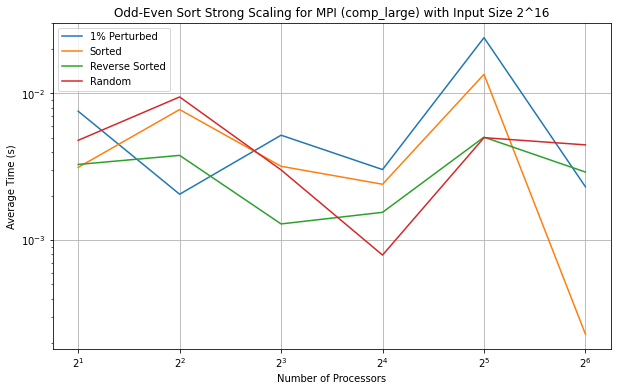

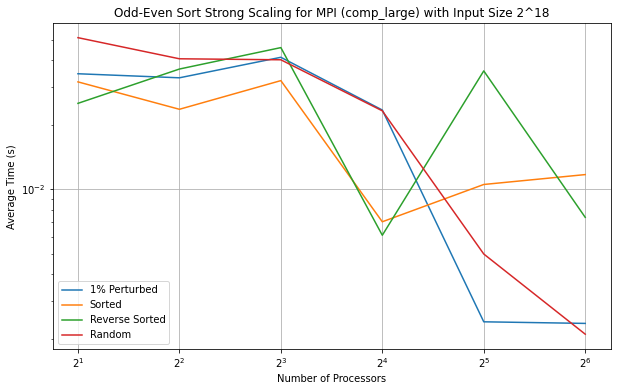

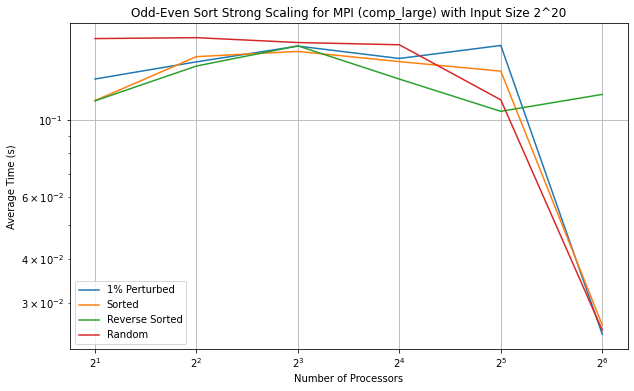

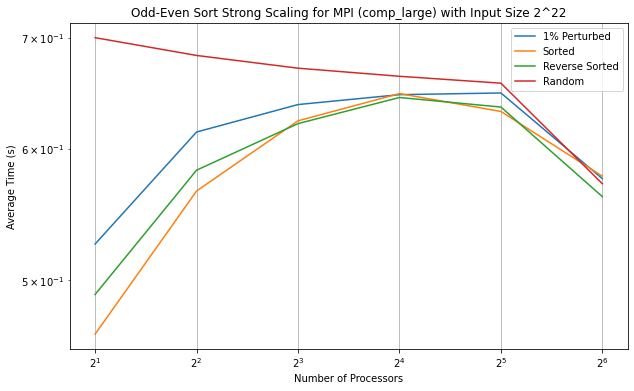

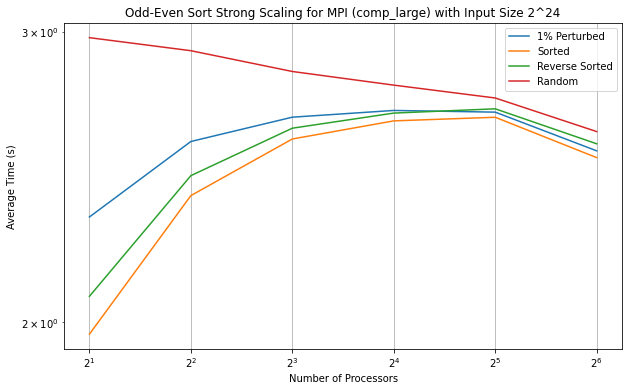

...

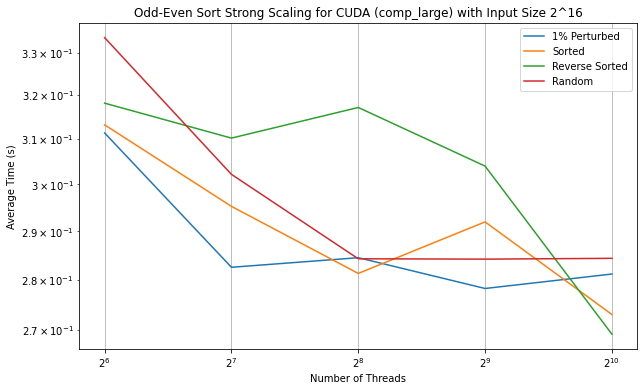

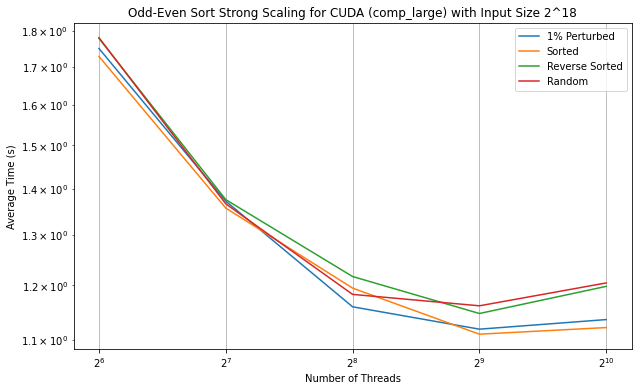

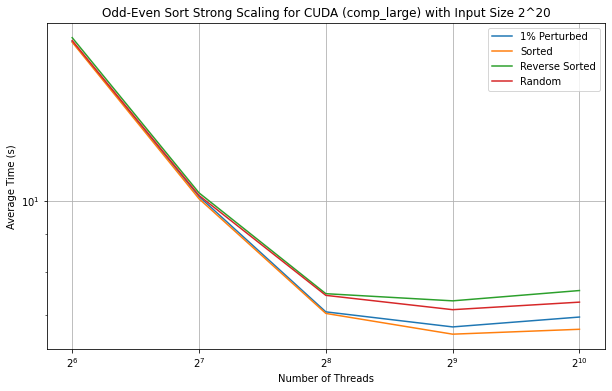

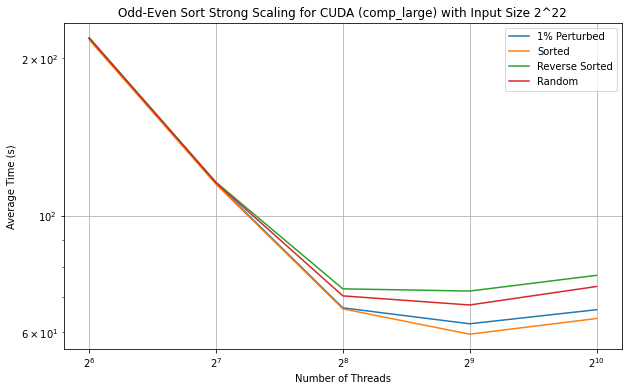

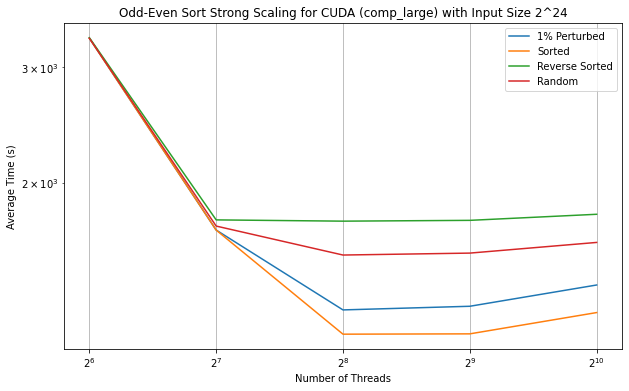

No handles with labels found to put in legend.


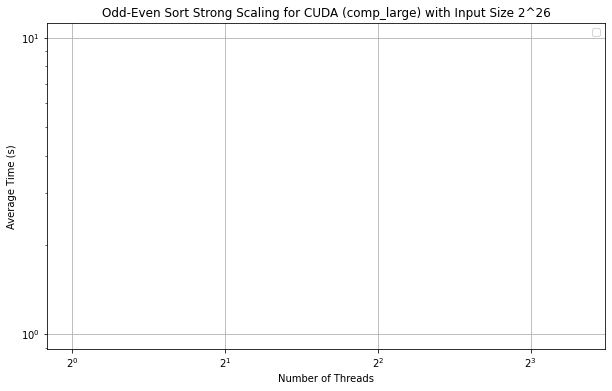

No handles with labels found to put in legend.


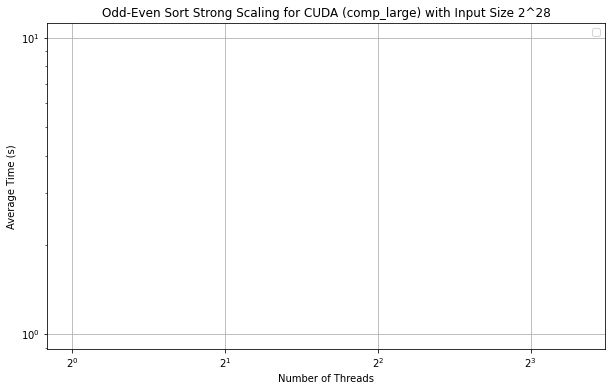

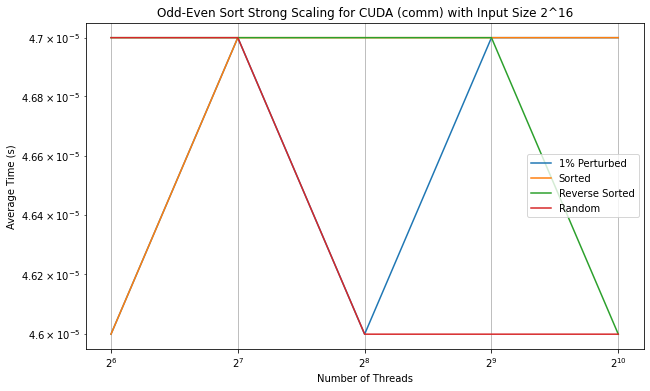

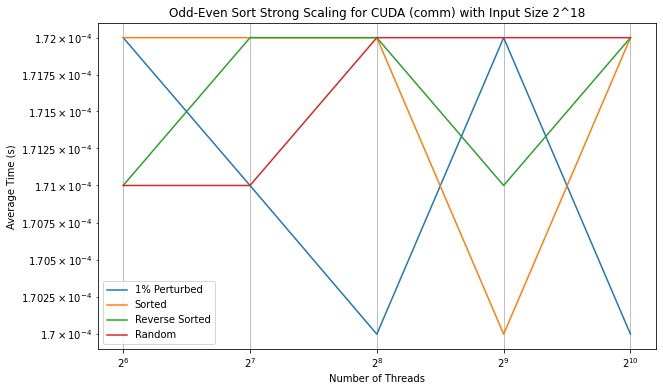

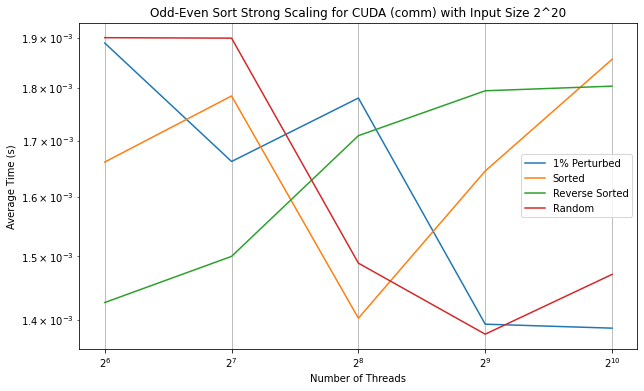

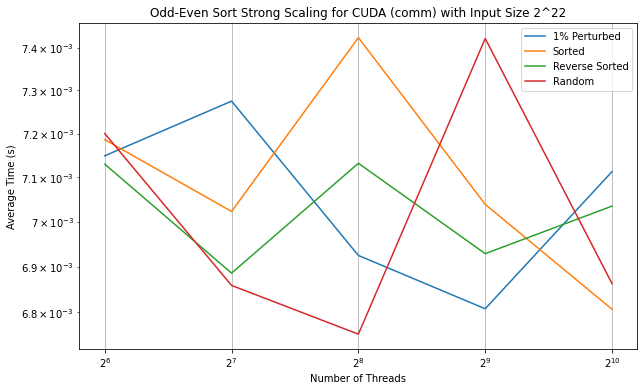

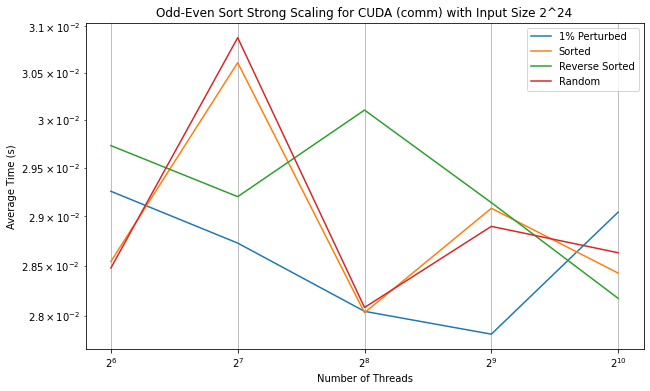

No handles with labels found to put in legend.


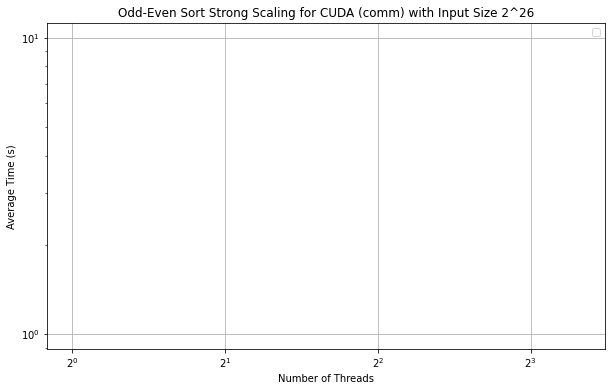

No handles with labels found to put in legend.


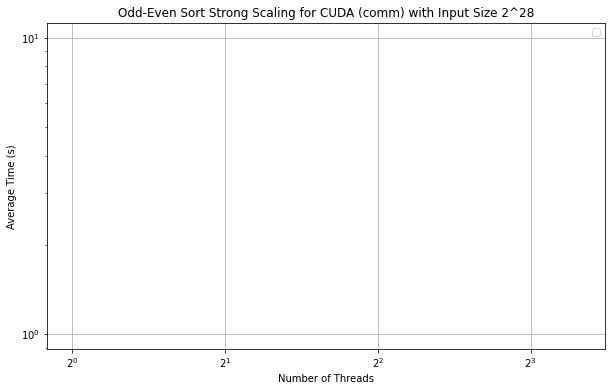

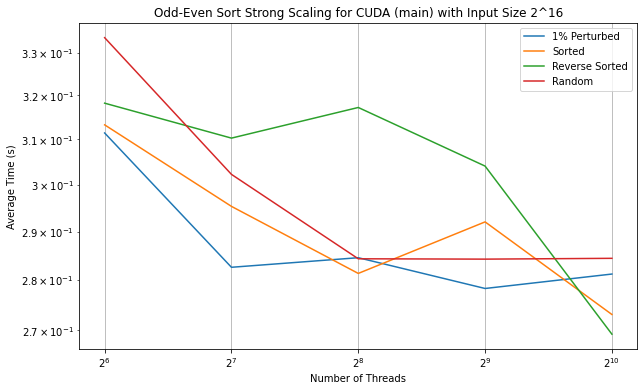

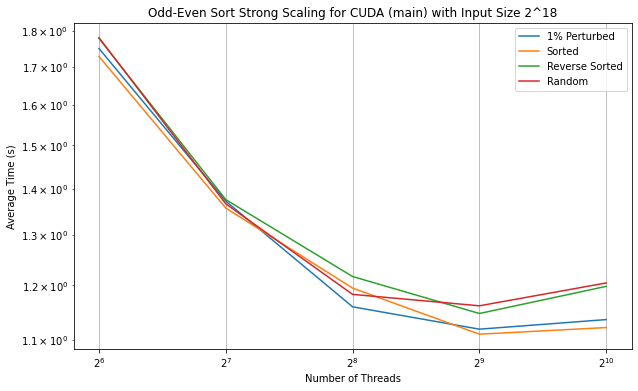

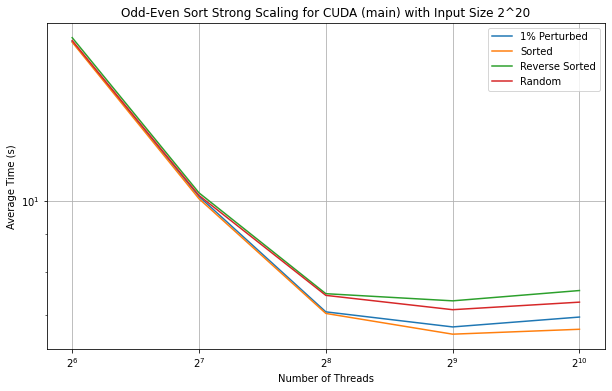

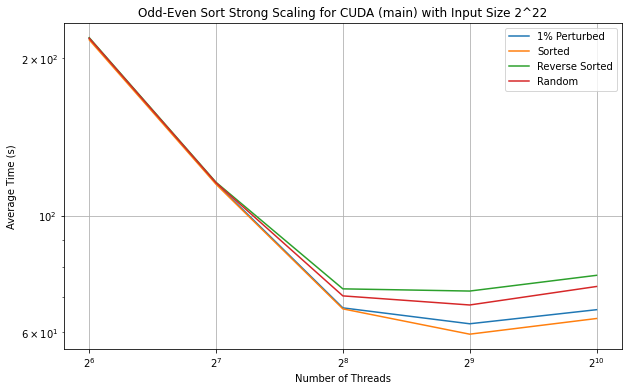

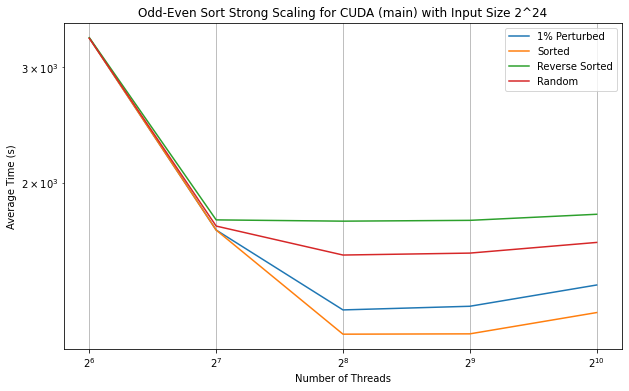

No handles with labels found to put in legend.


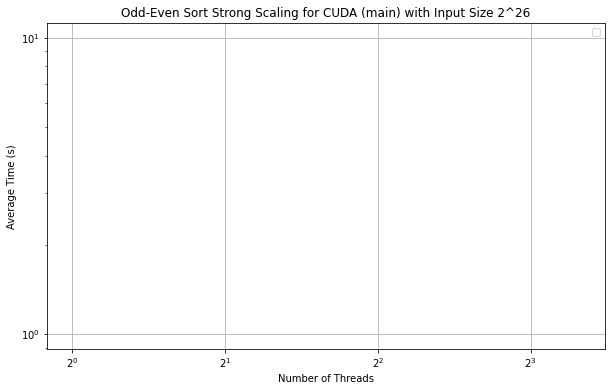

No handles with labels found to put in legend.


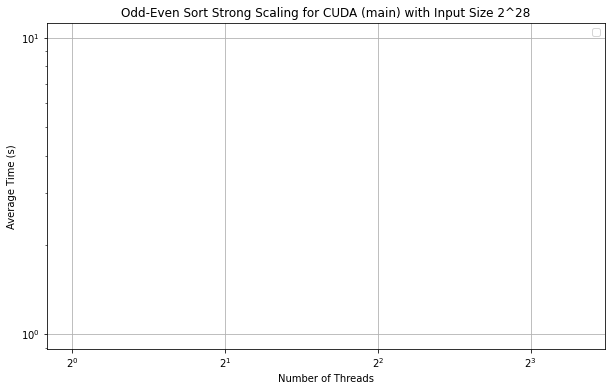

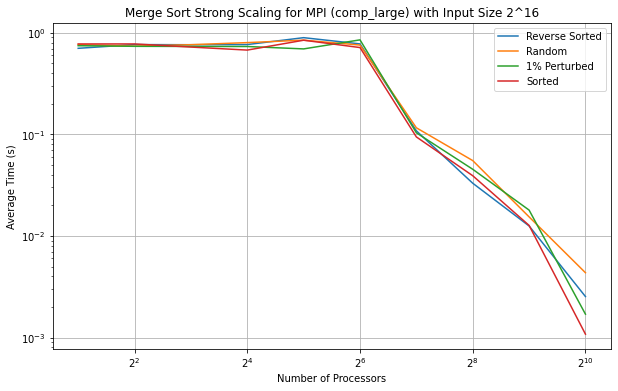

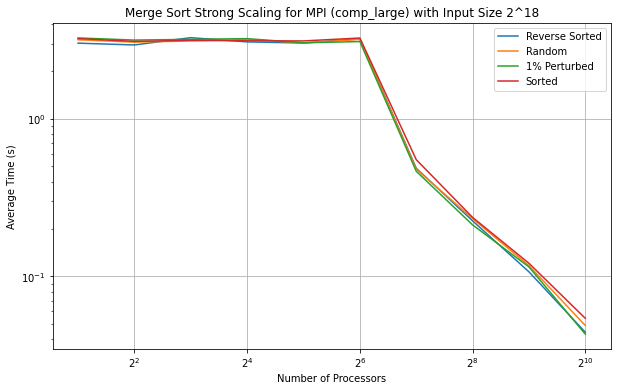

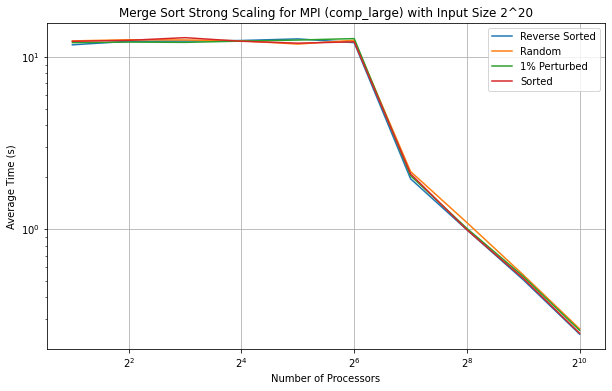

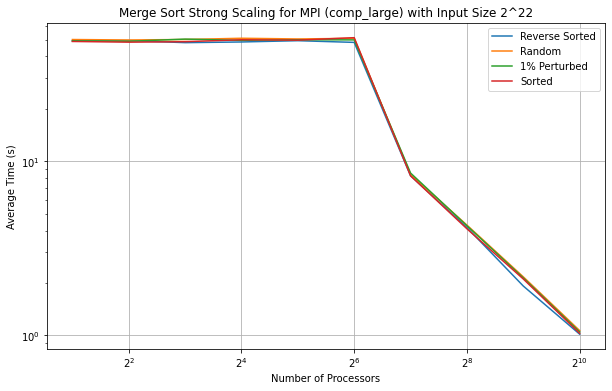

No handles with labels found to put in legend.


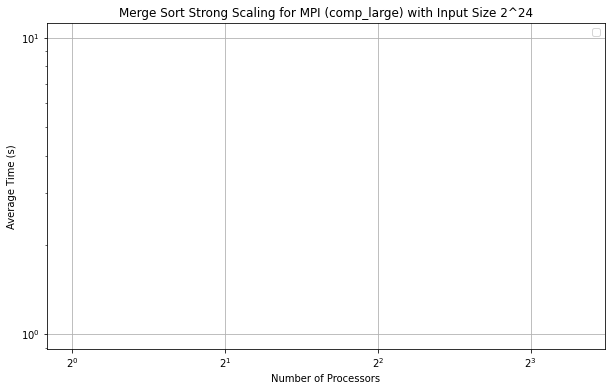

No handles with labels found to put in legend.


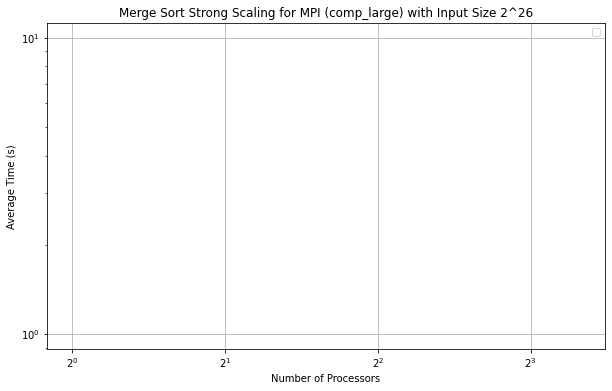

No handles with labels found to put in legend.


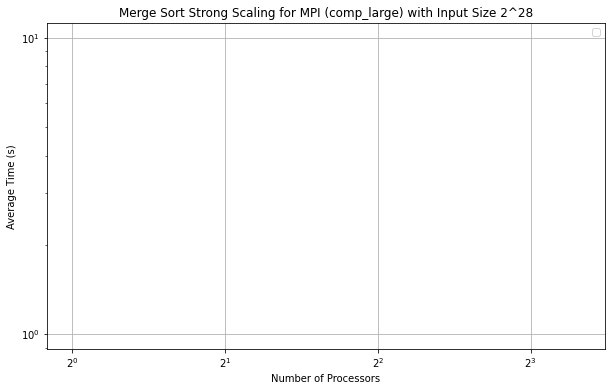

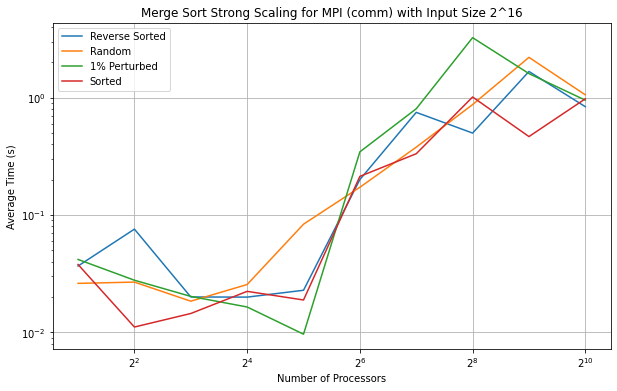

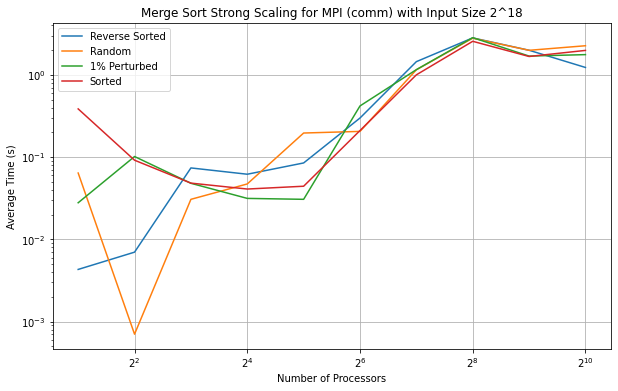

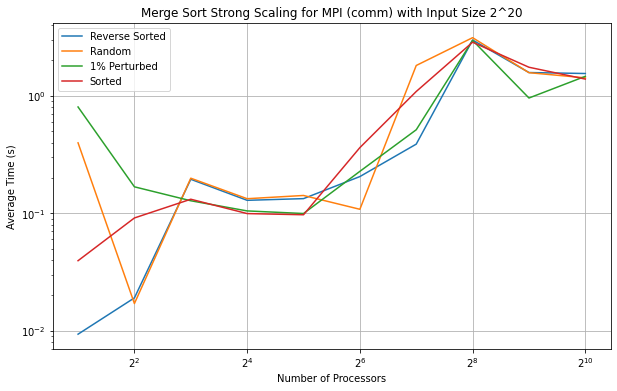

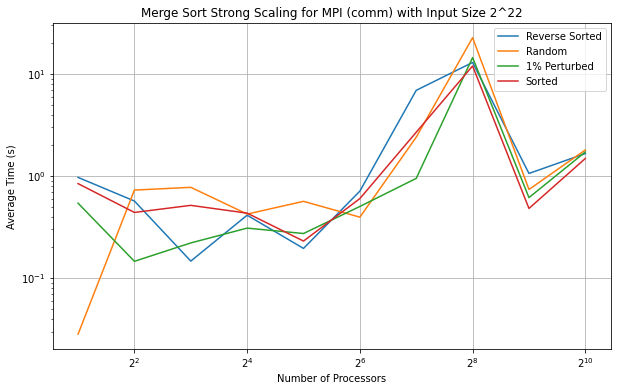

No handles with labels found to put in legend.


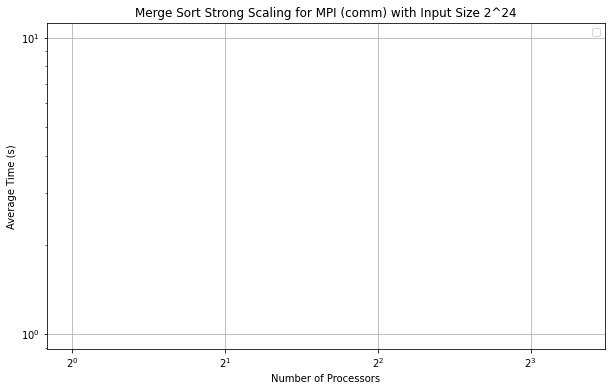

No handles with labels found to put in legend.


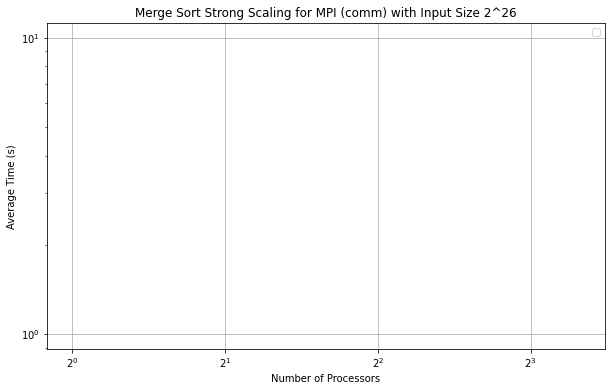

No handles with labels found to put in legend.


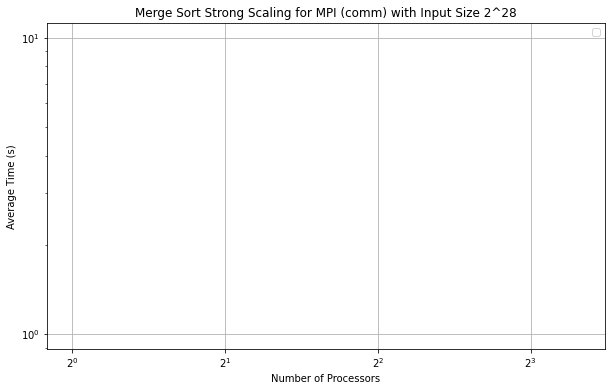

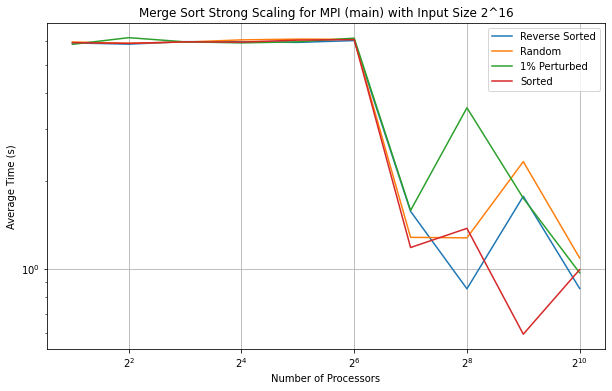

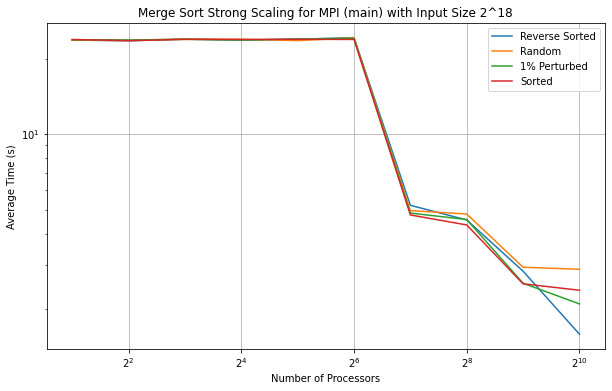

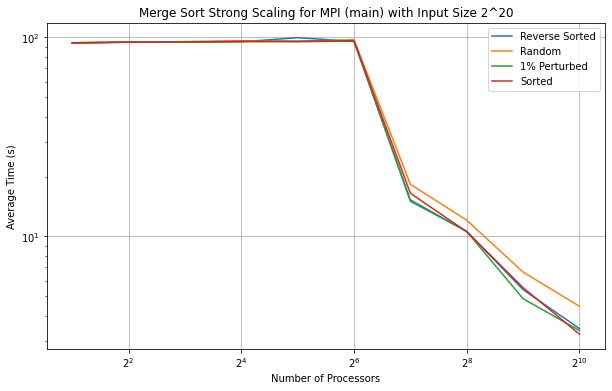

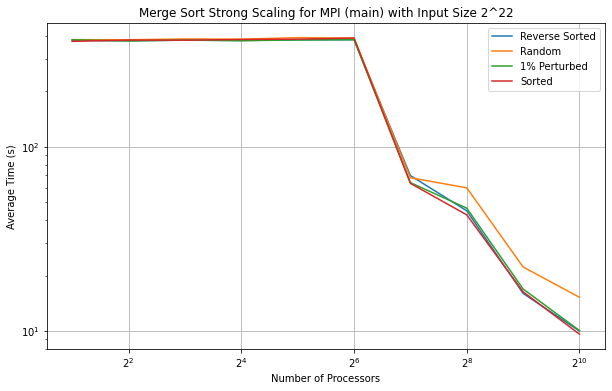

No handles with labels found to put in legend.


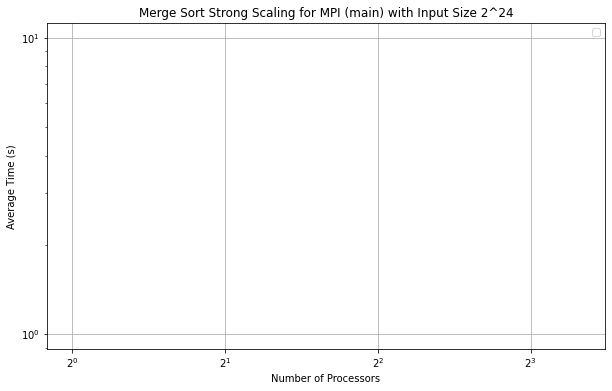

No handles with labels found to put in legend.


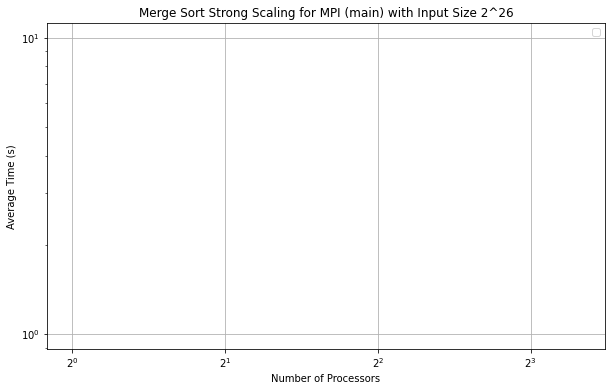

No handles with labels found to put in legend.


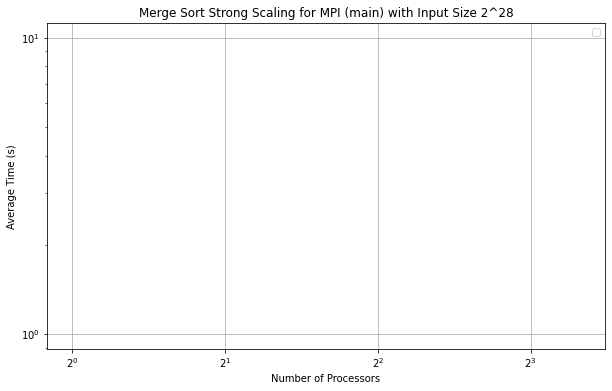

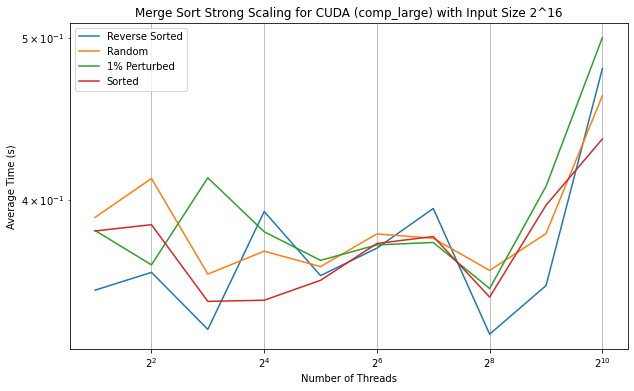

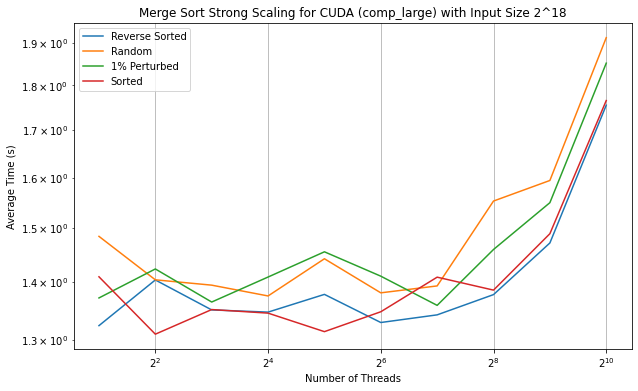

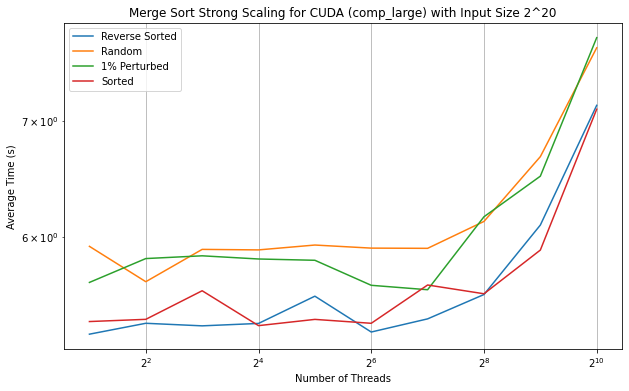

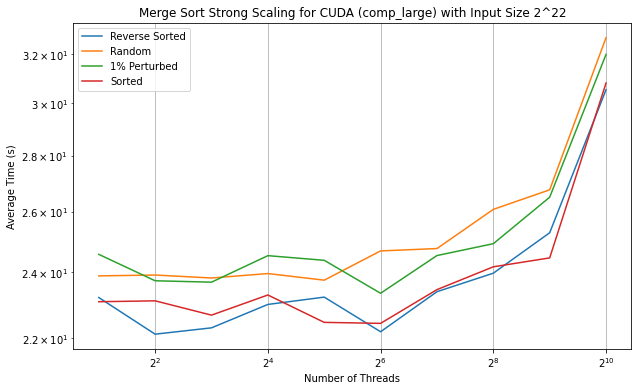

No handles with labels found to put in legend.


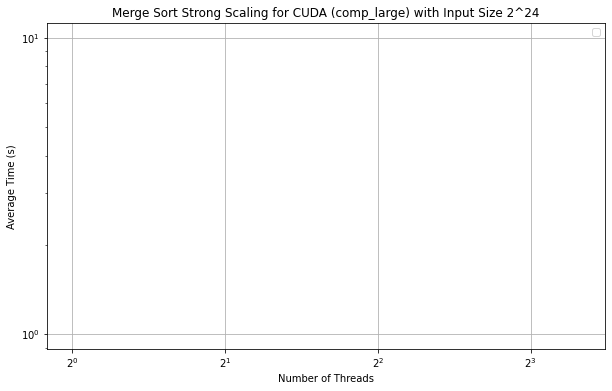

No handles with labels found to put in legend.


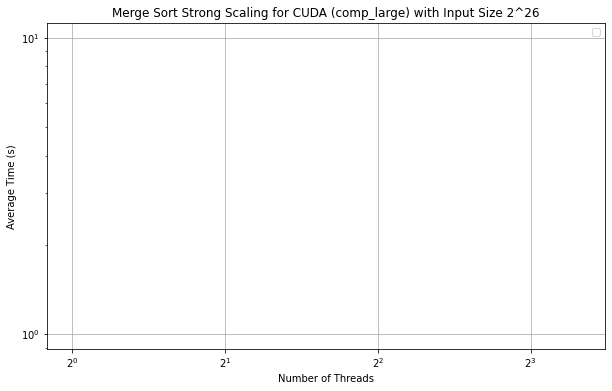

No handles with labels found to put in legend.


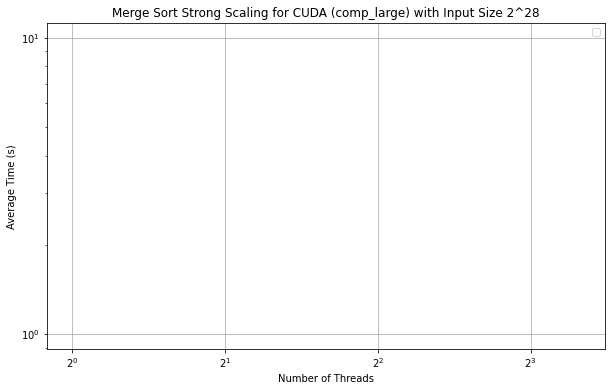

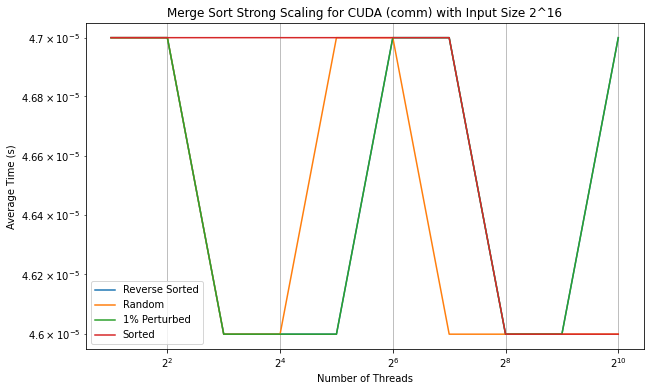

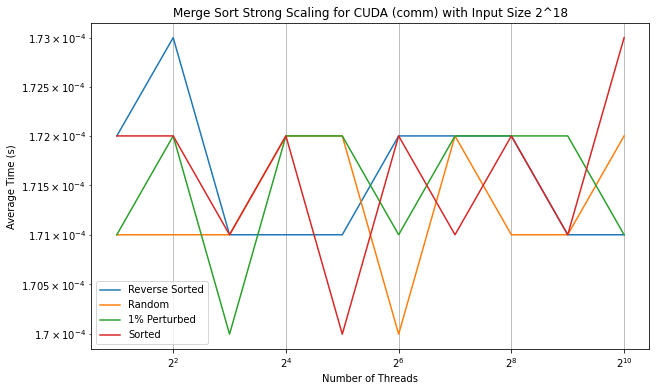

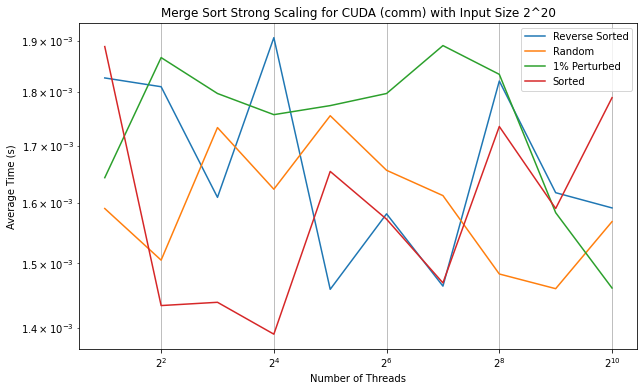

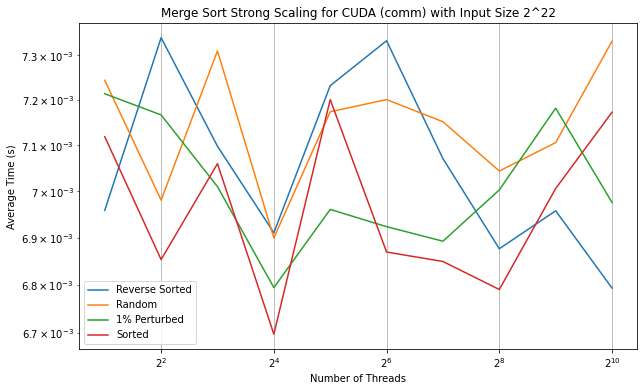

No handles with labels found to put in legend.


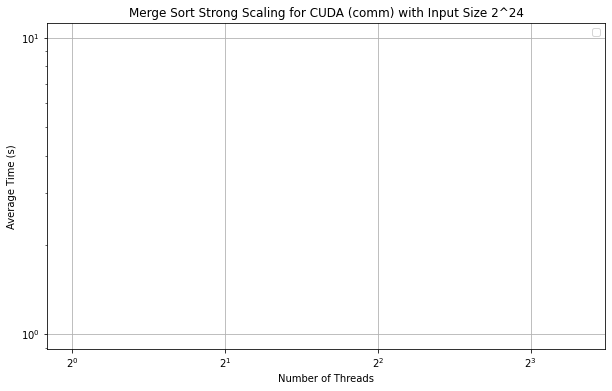

No handles with labels found to put in legend.


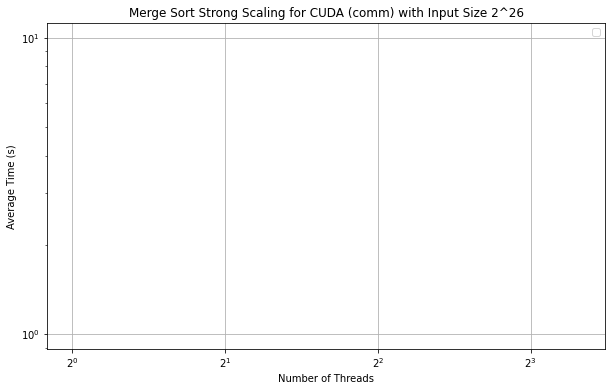

No handles with labels found to put in legend.


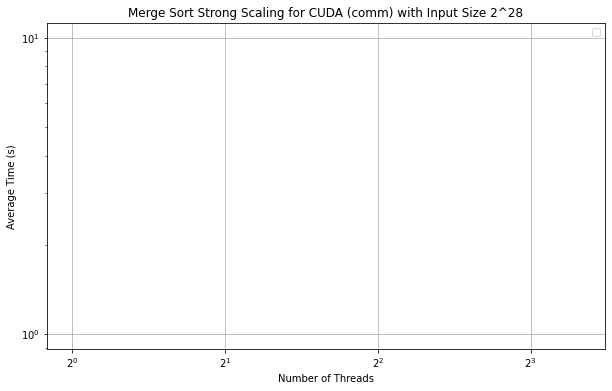

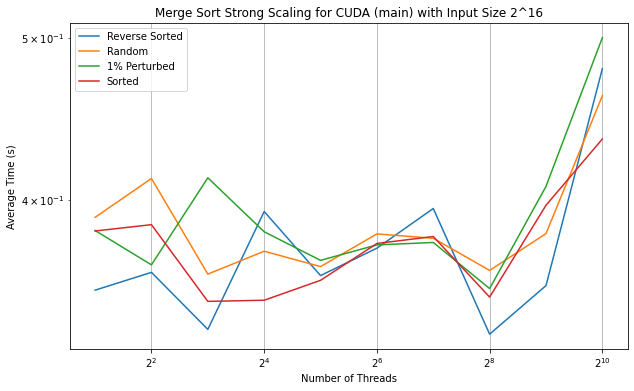

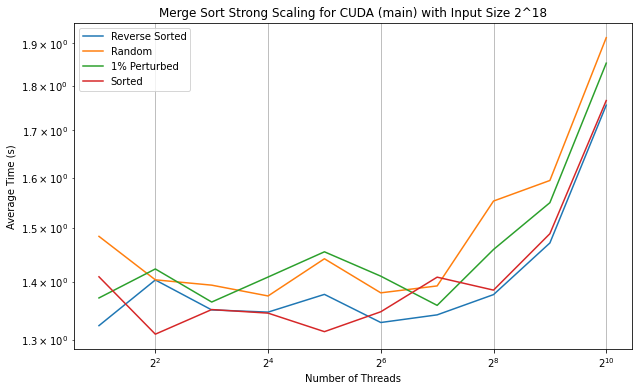

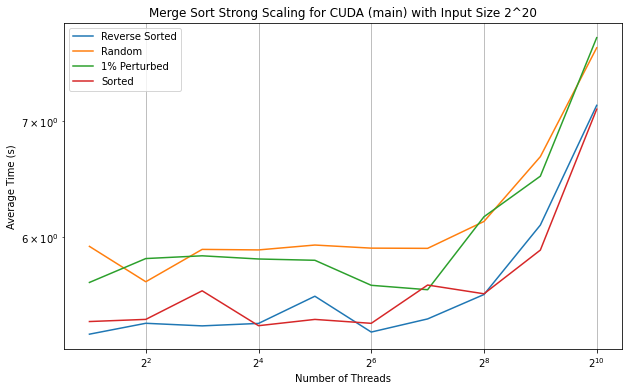

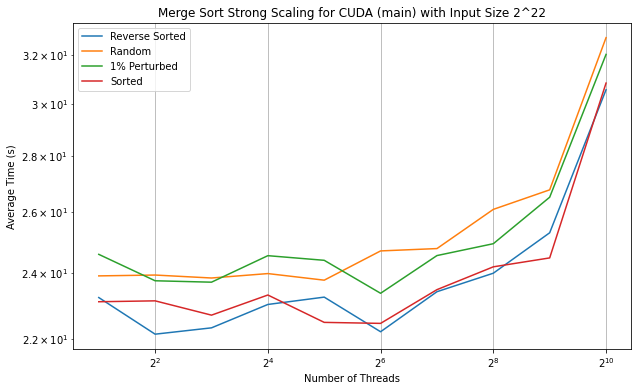

No handles with labels found to put in legend.


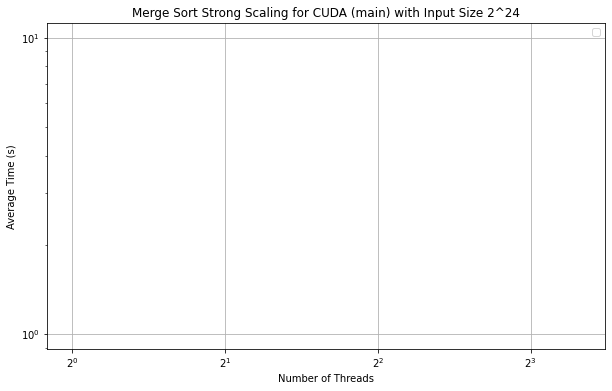

No handles with labels found to put in legend.


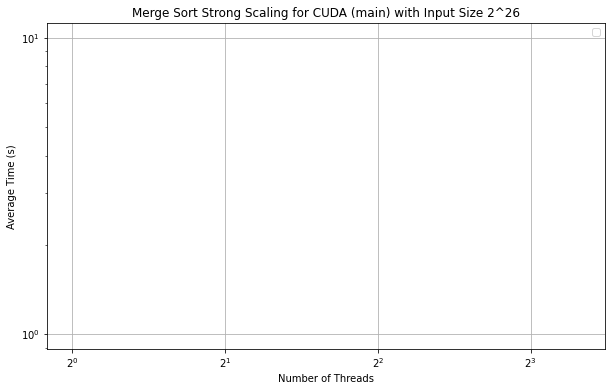

No handles with labels found to put in legend.


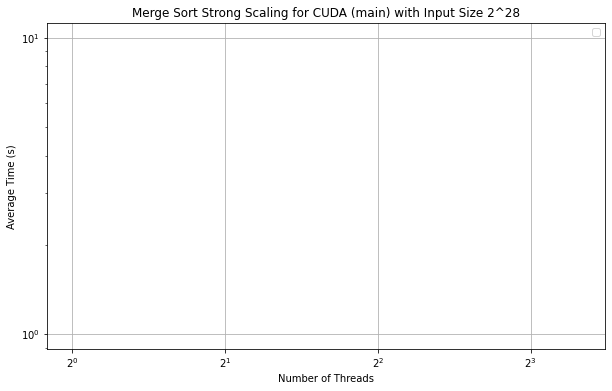

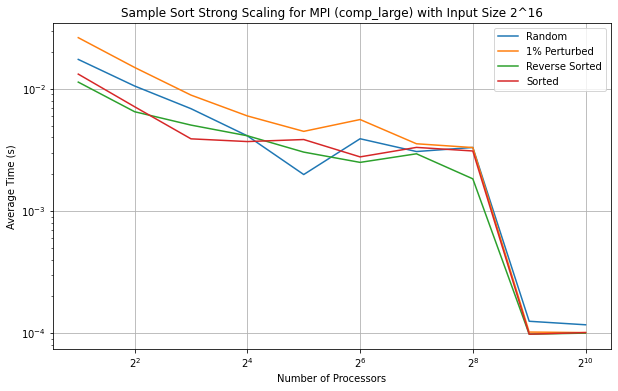

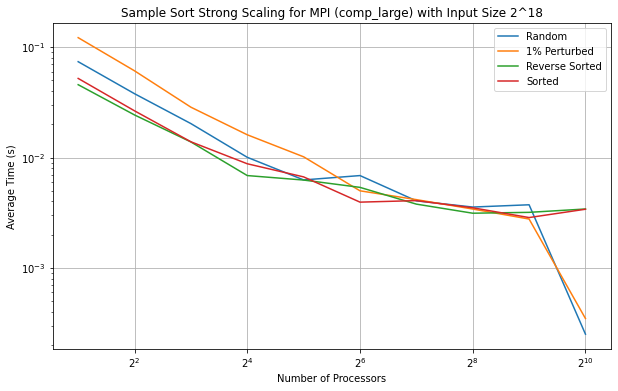

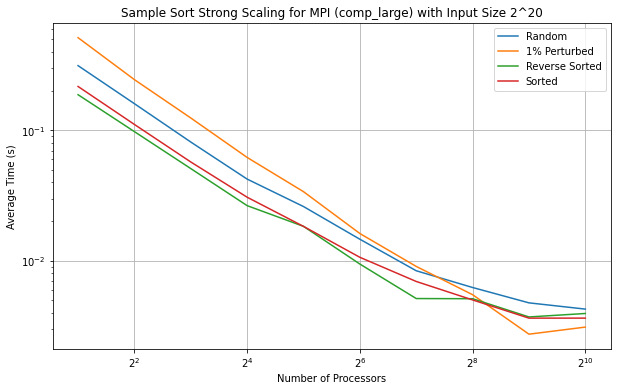

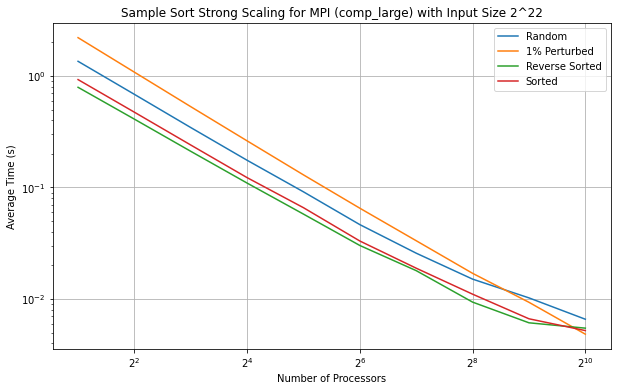

...

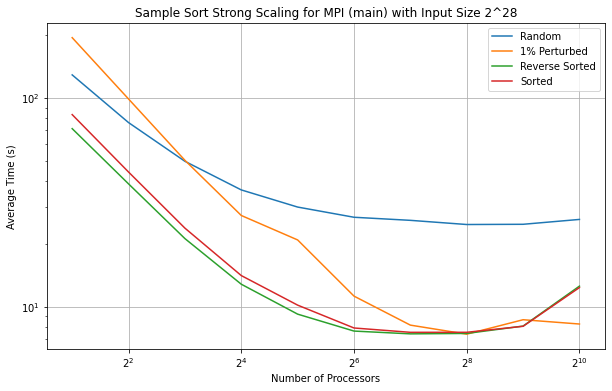

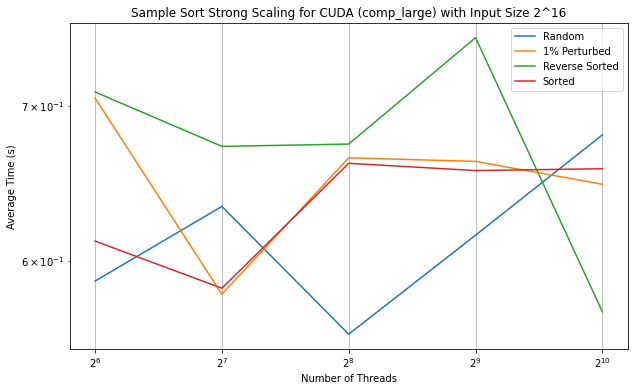

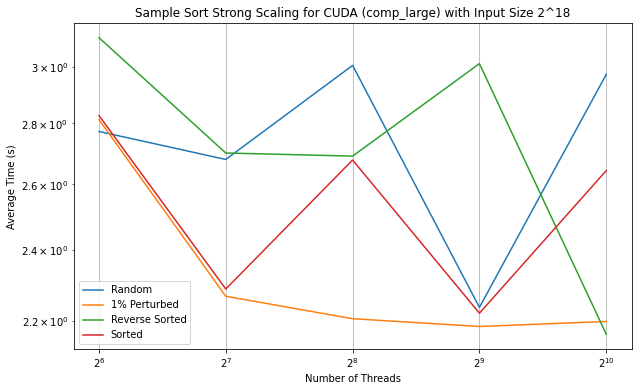

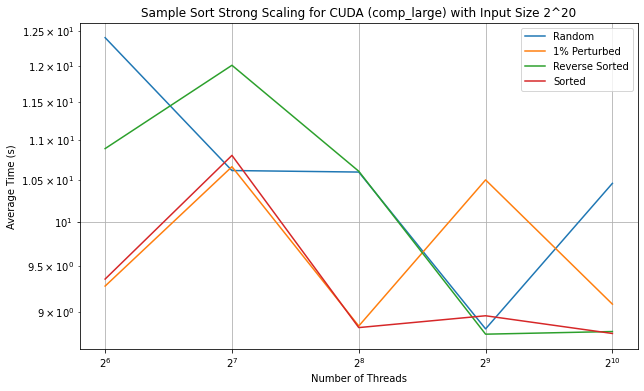

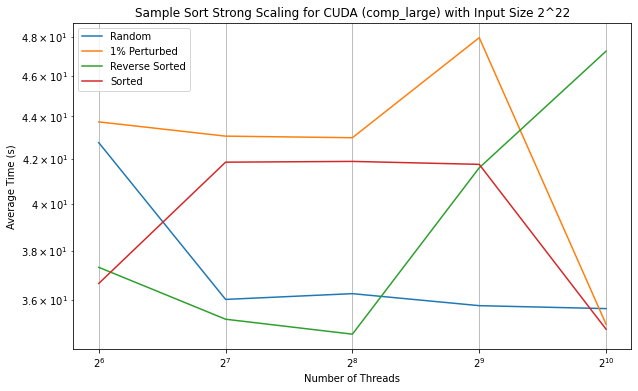

No handles with labels found to put in legend.


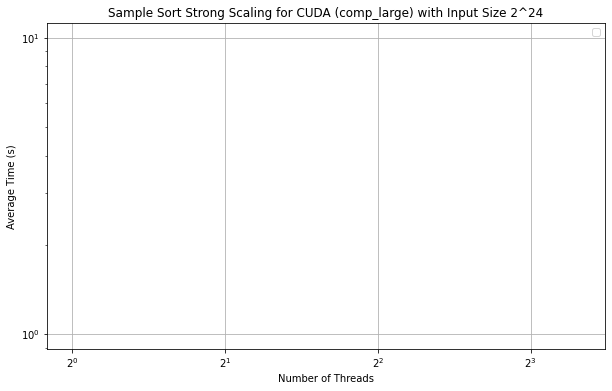

No handles with labels found to put in legend.


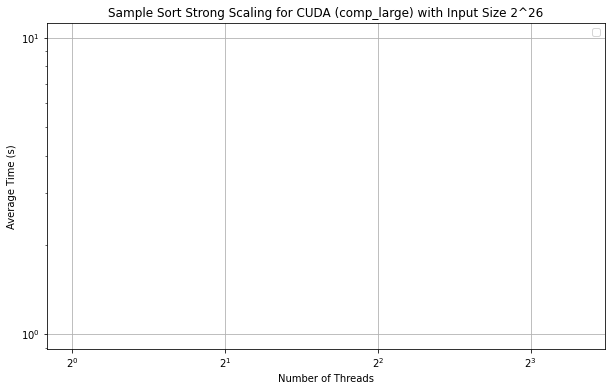

No handles with labels found to put in legend.


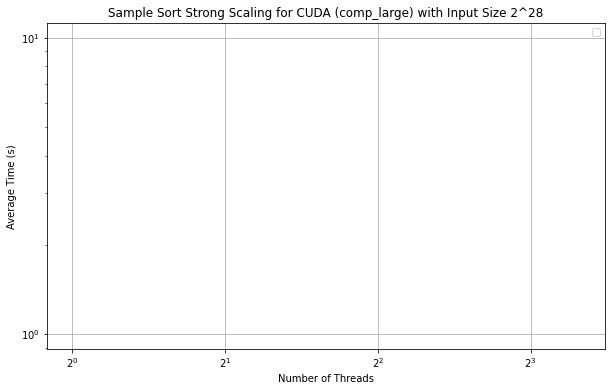

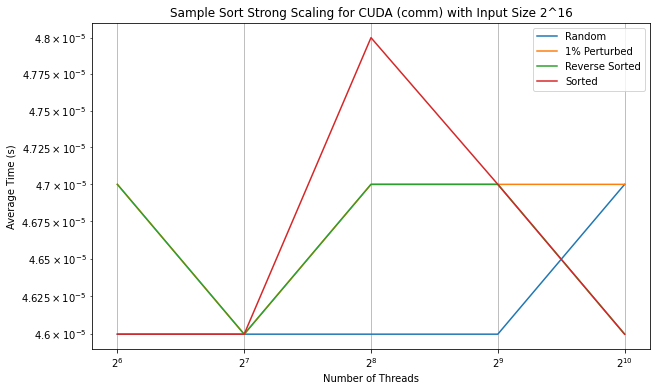

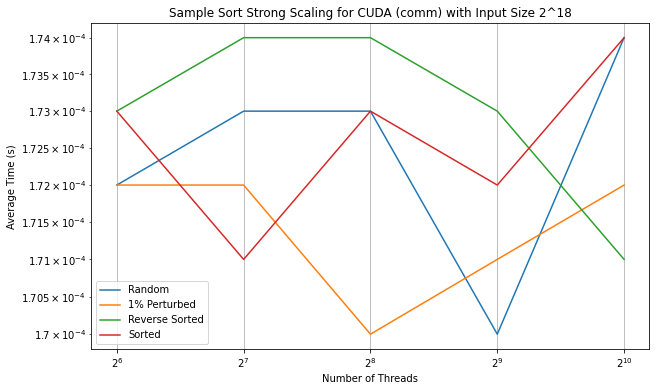

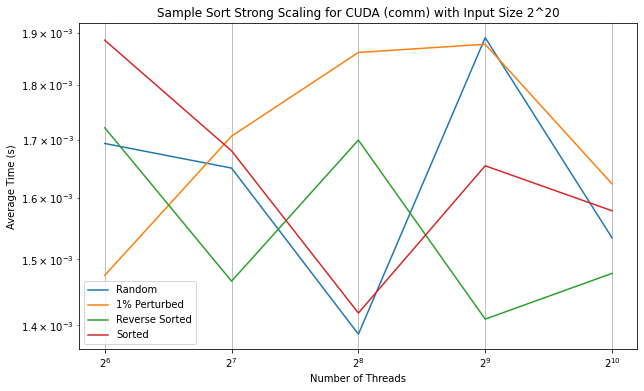

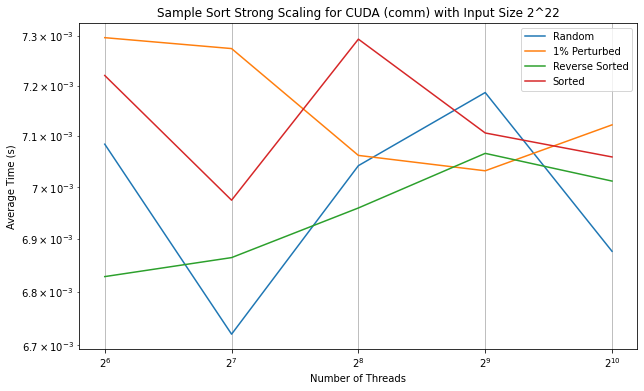

No handles with labels found to put in legend.


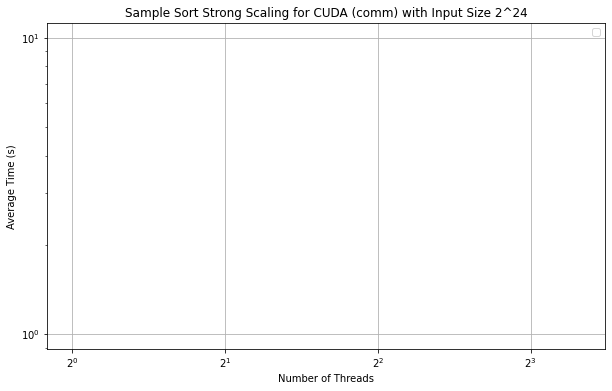

No handles with labels found to put in legend.


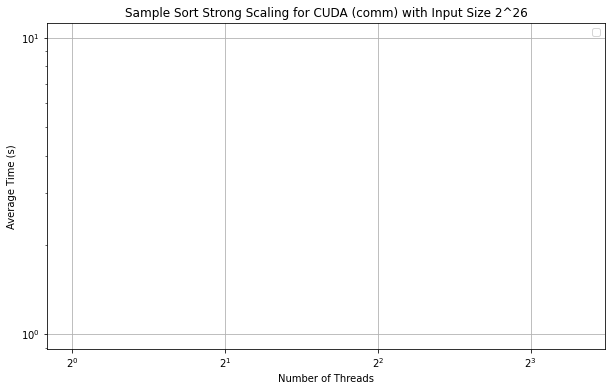

No handles with labels found to put in legend.


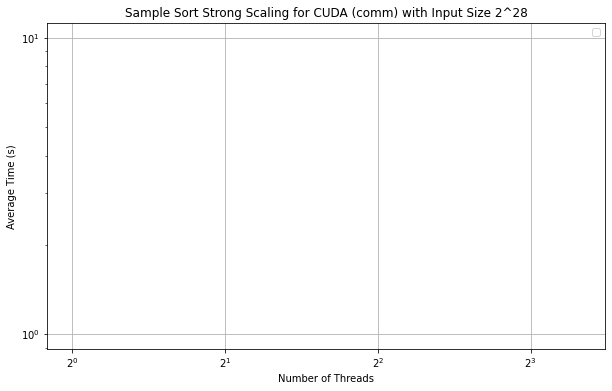

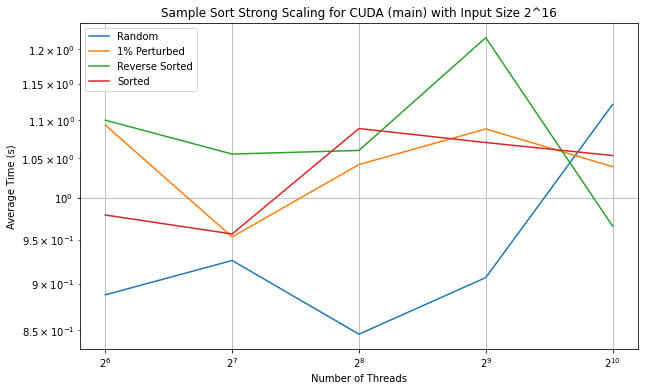

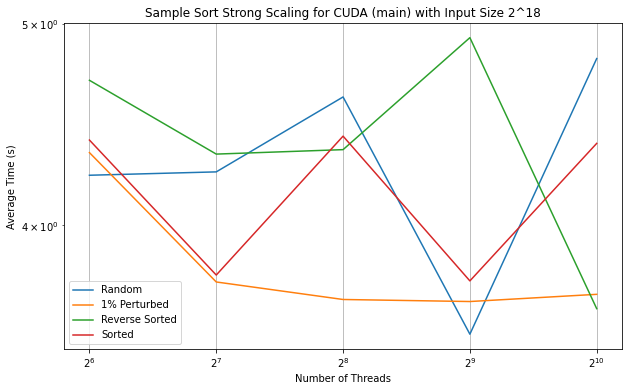

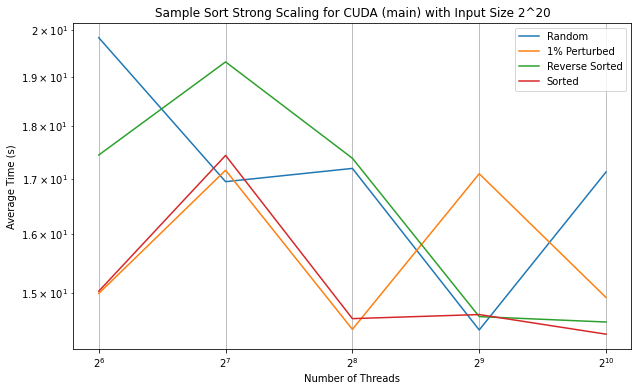

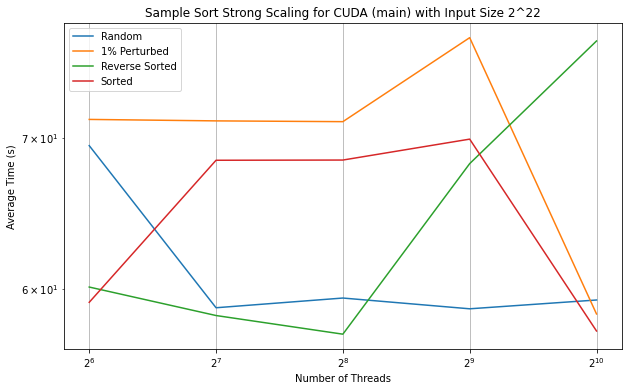

No handles with labels found to put in legend.


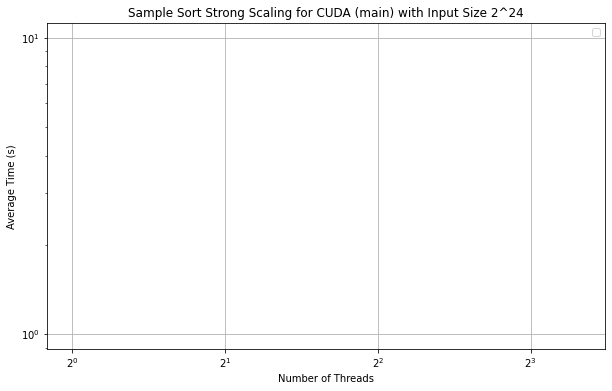

No handles with labels found to put in legend.


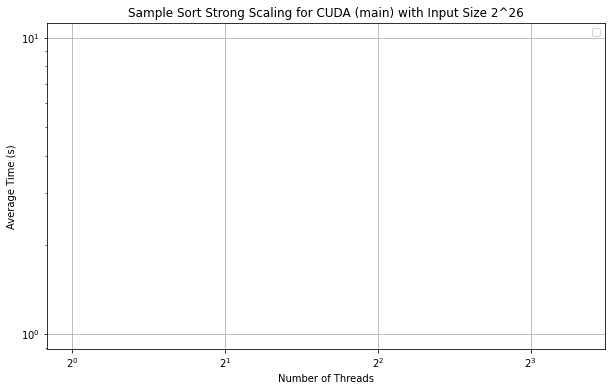

No handles with labels found to put in legend.


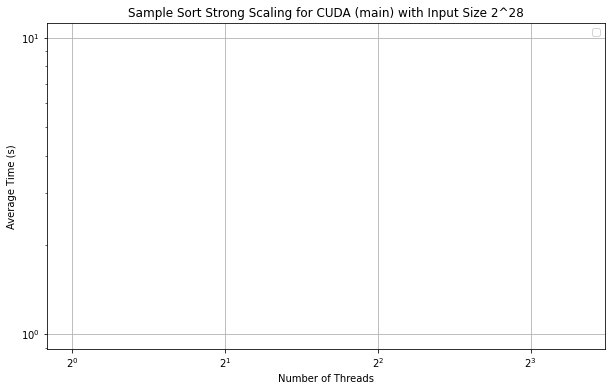

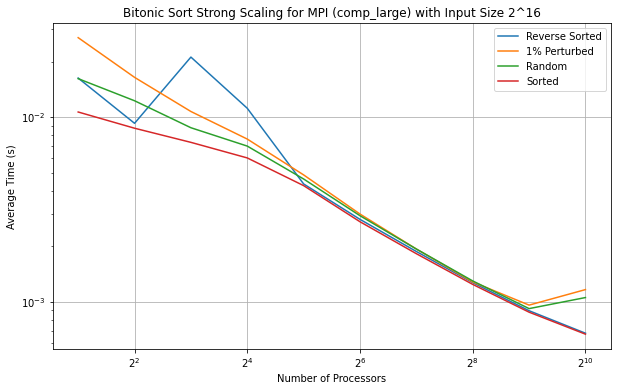

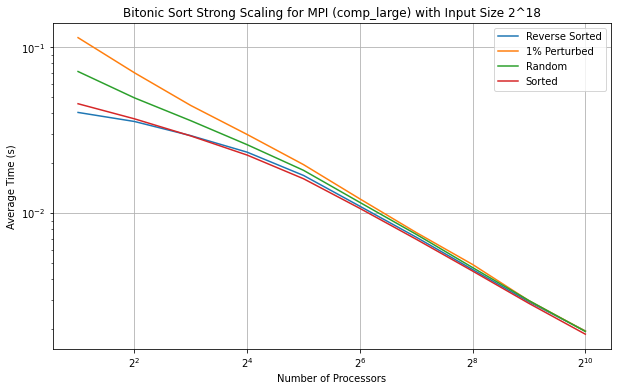

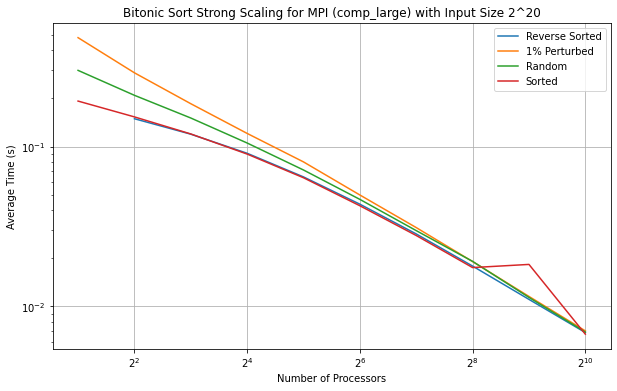

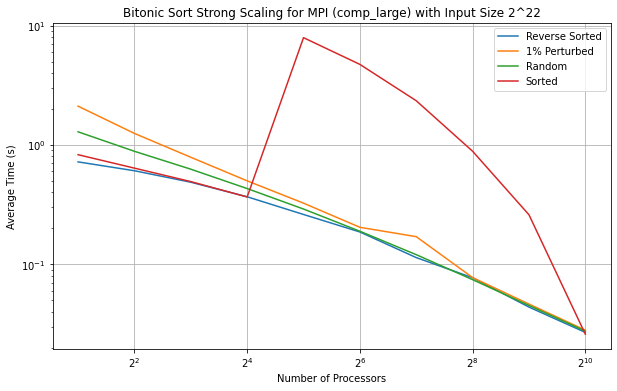

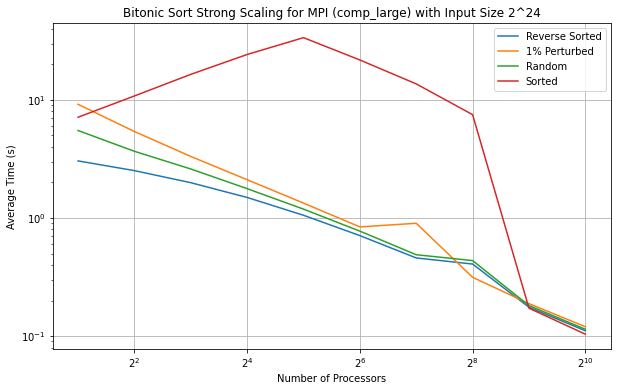

No handles with labels found to put in legend.


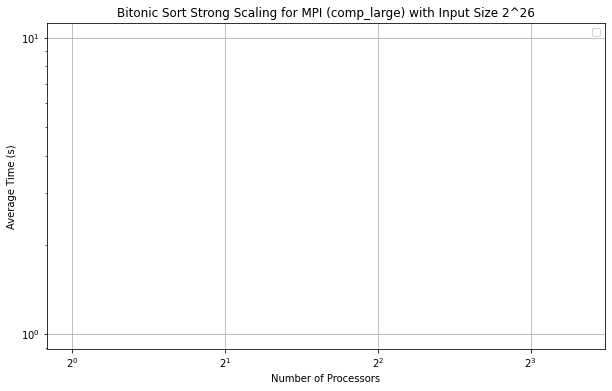

No handles with labels found to put in legend.


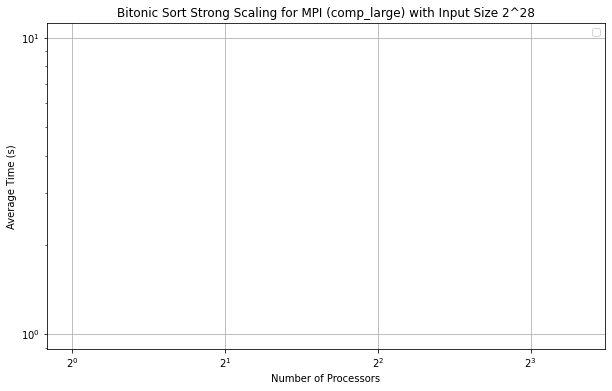

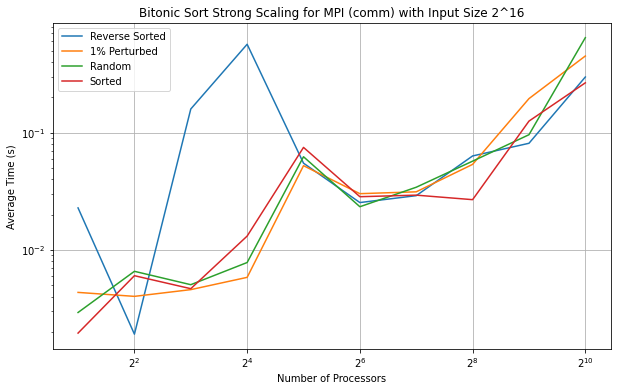

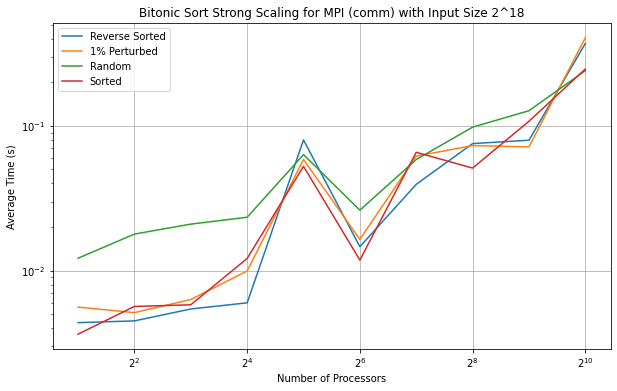

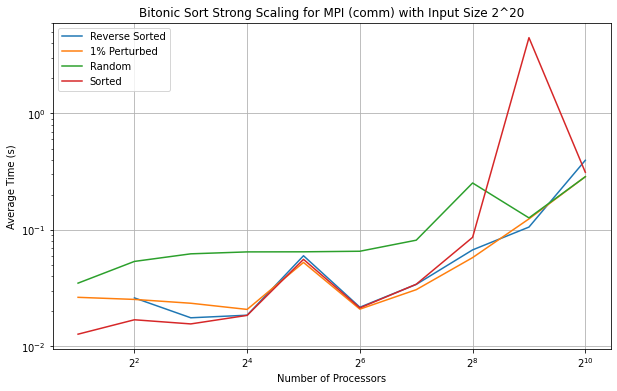

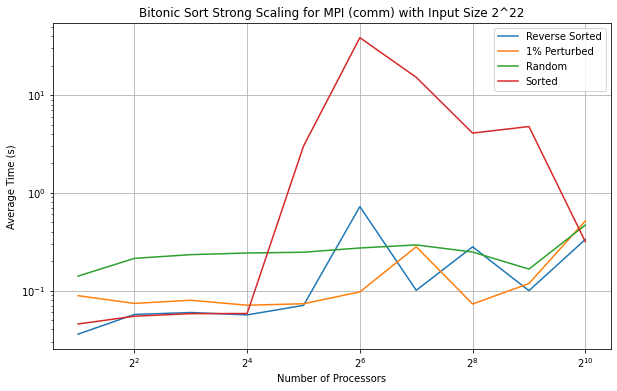

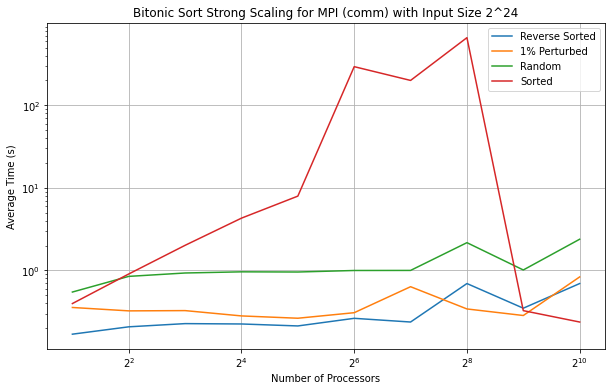

No handles with labels found to put in legend.


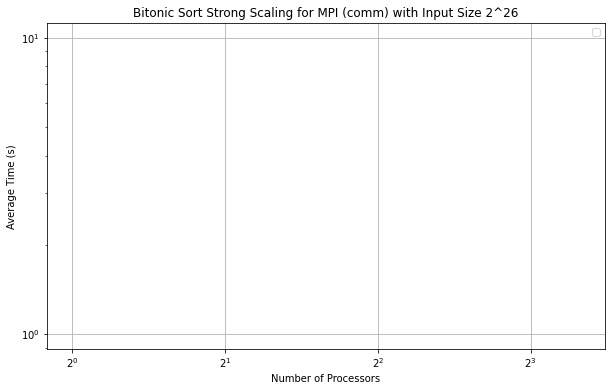

No handles with labels found to put in legend.


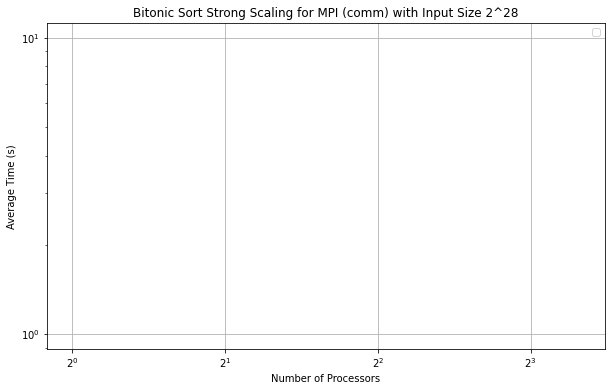

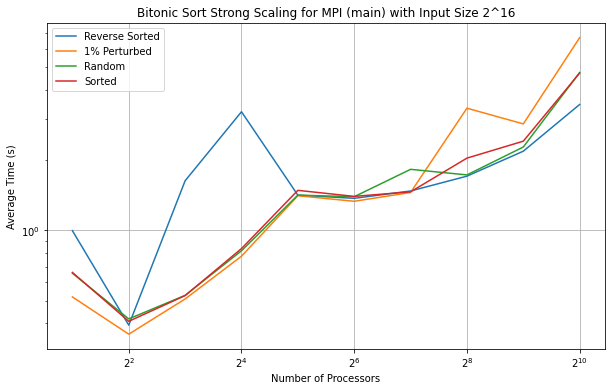

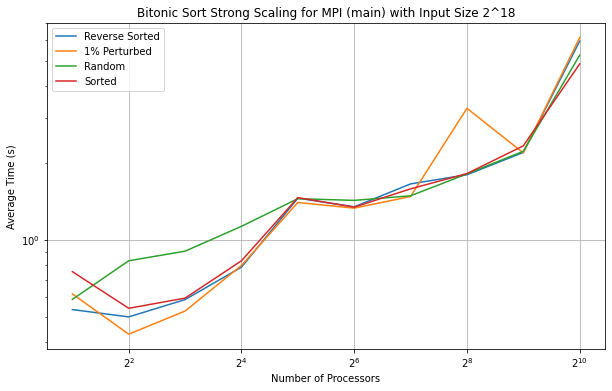

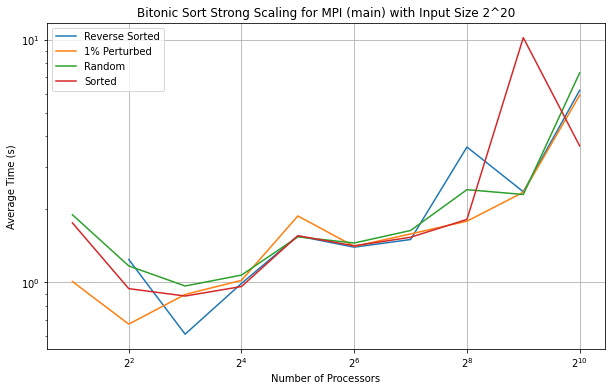

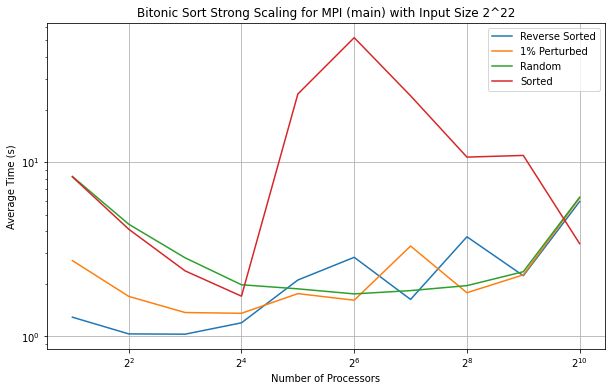

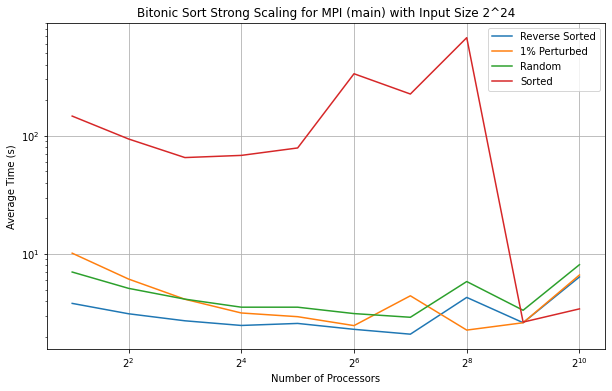

No handles with labels found to put in legend.


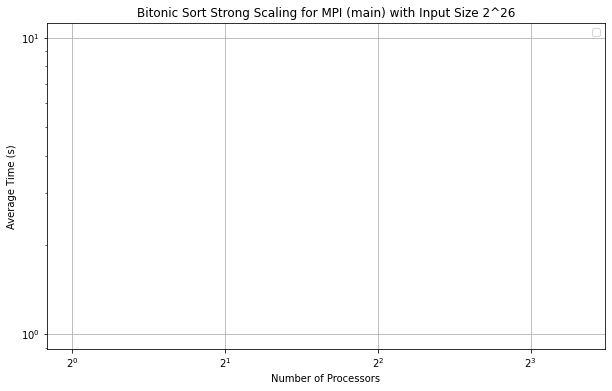

No handles with labels found to put in legend.


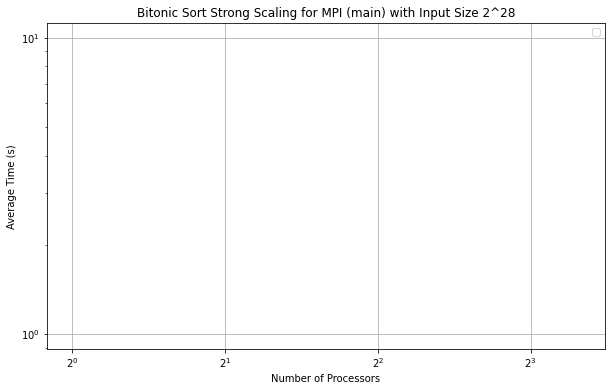

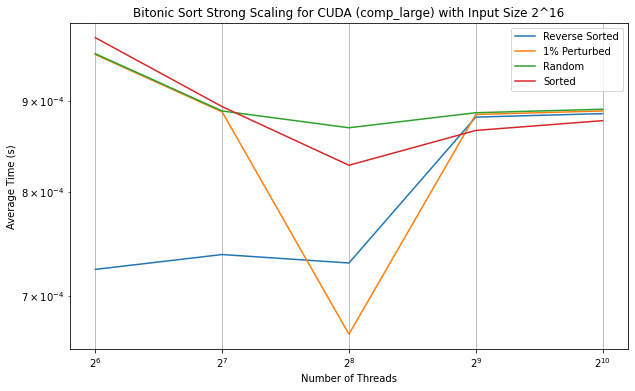

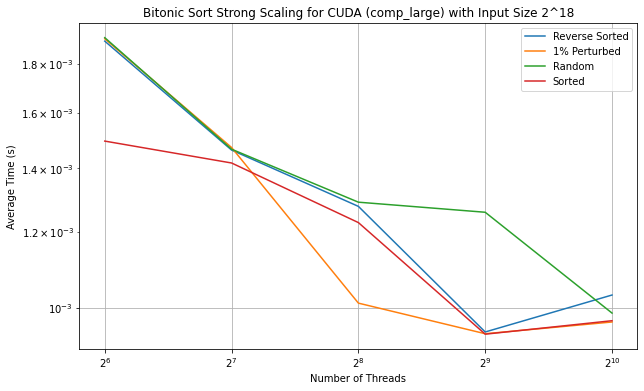

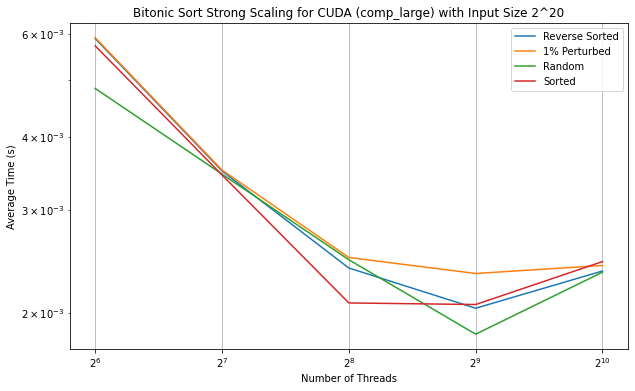

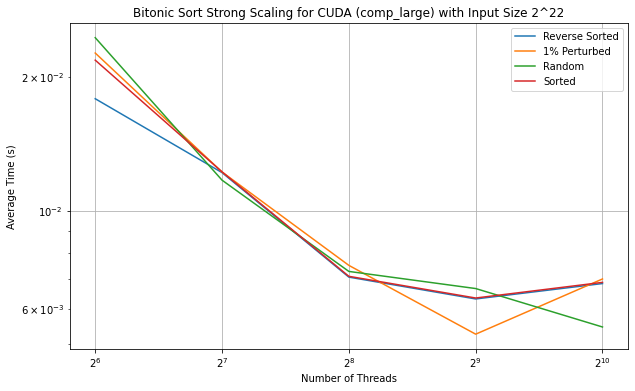

...

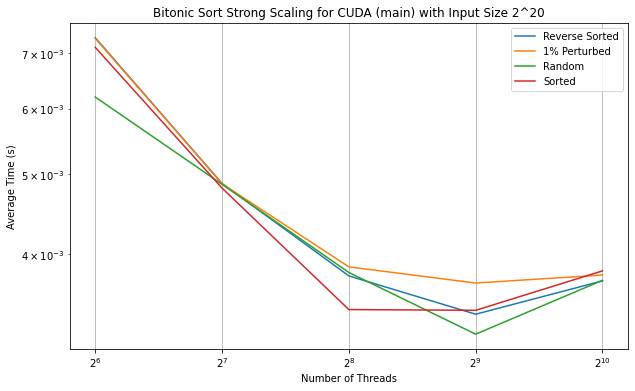

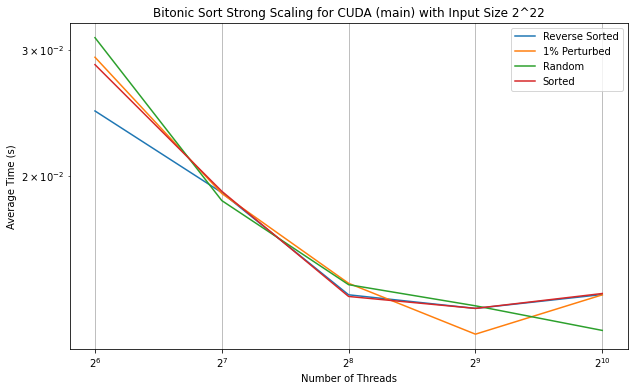

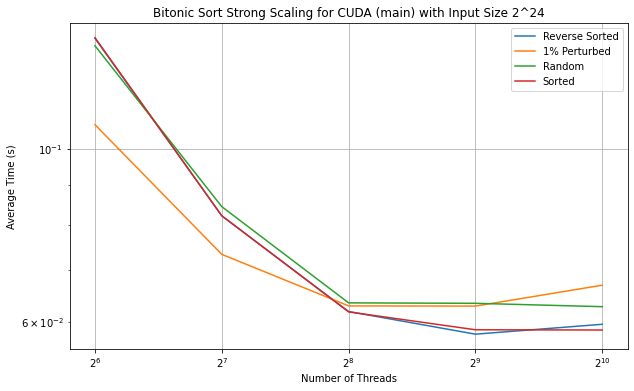

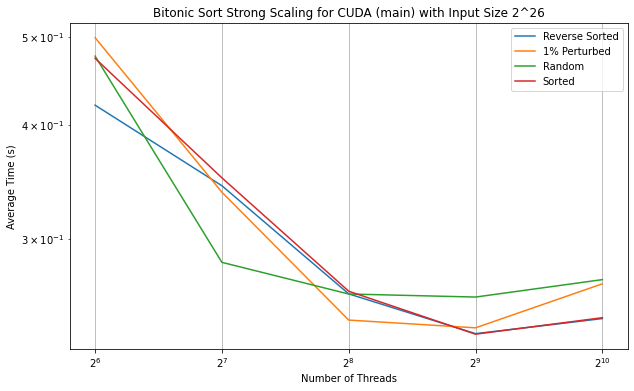

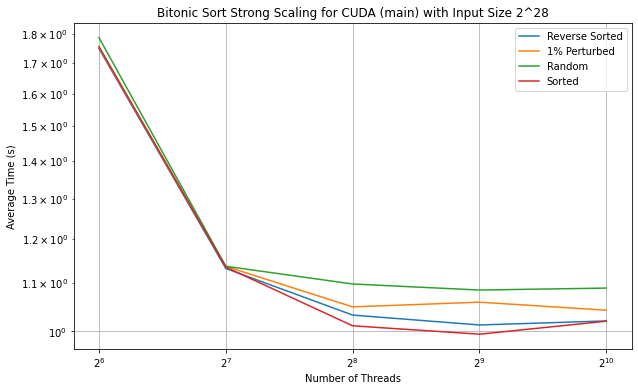

In [25]:
for algorithm in cali_dict.keys():
    for implementation in implementations:
        for region in regions:
            for input_size in input_sizes:
                plot_strong_scaling(merged_df_dict[algorithm], input_size, implementation, region, algorithm)

Create Strong Scaling Speedup Plots

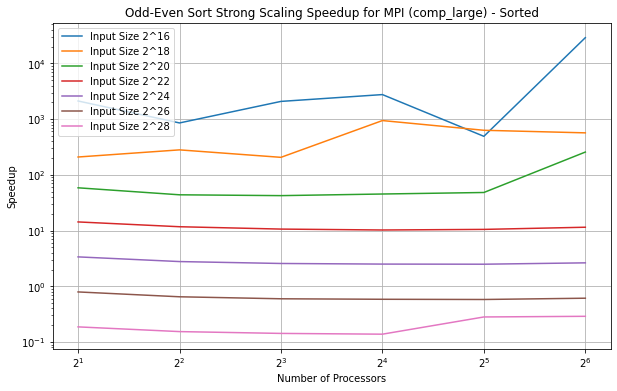

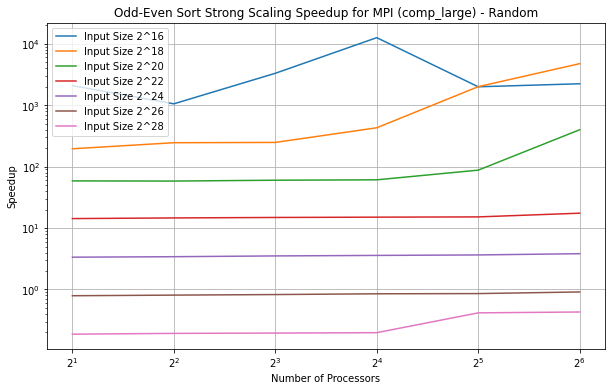

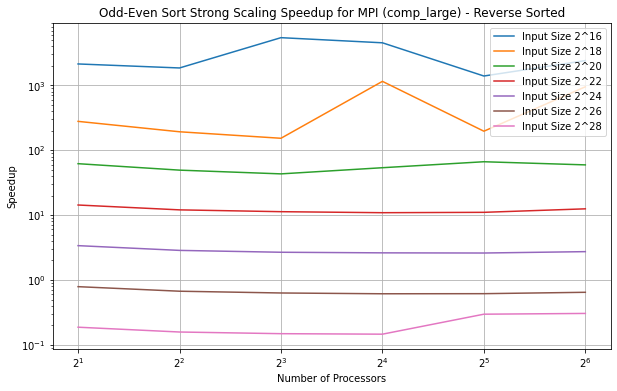

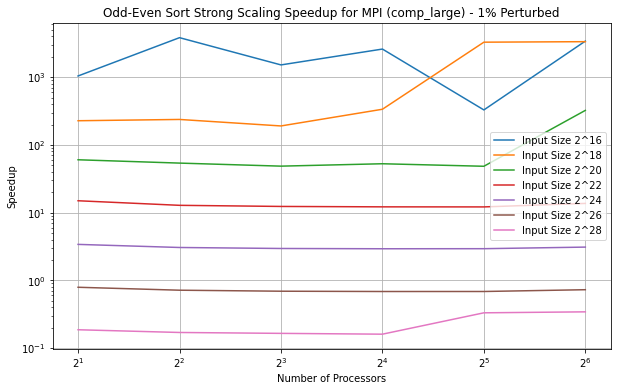

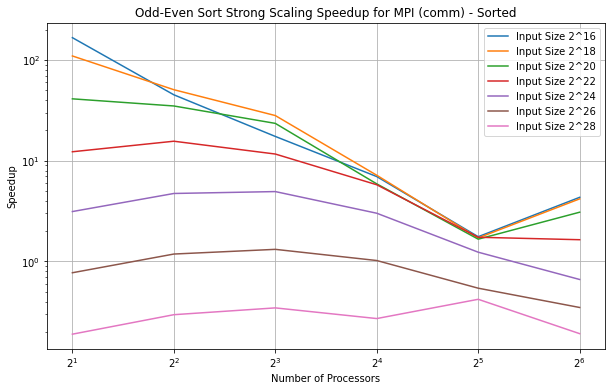

...

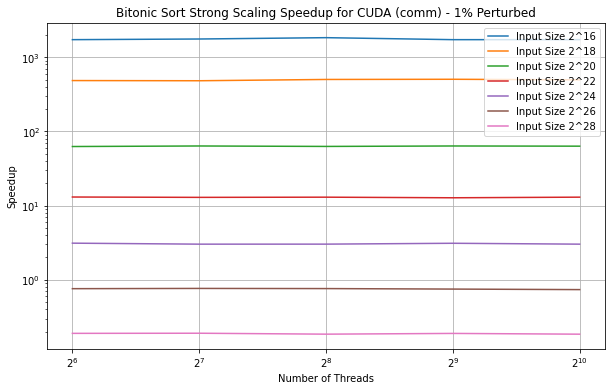

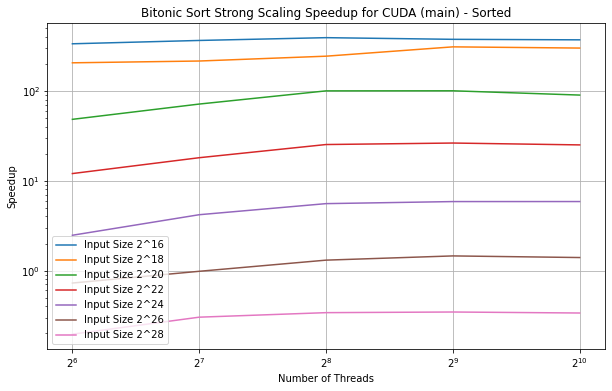

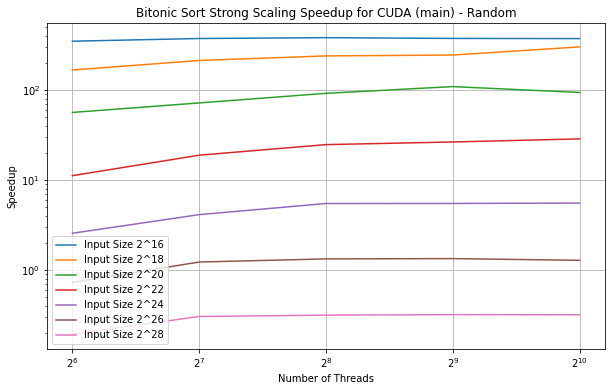

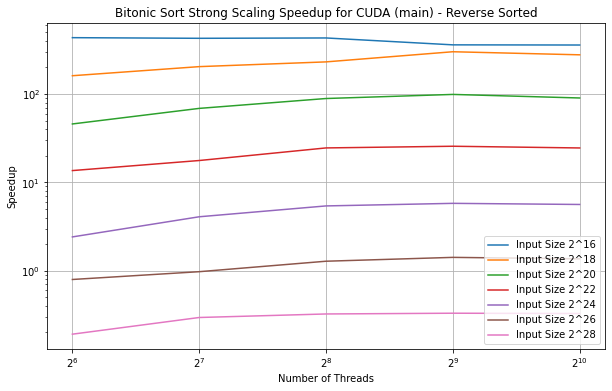

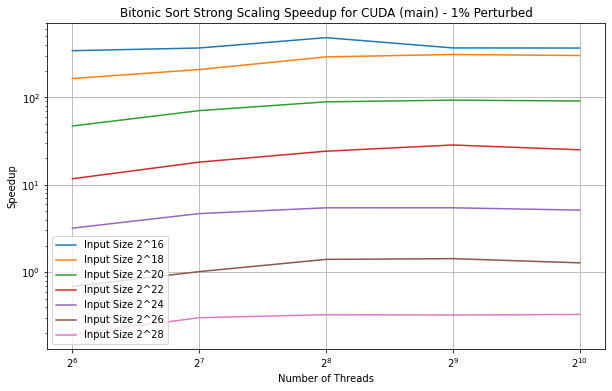

In [26]:
for algorithm in cali_dict.keys():
    for implementation in implementations:
        for region in regions:
            for input_type in input_types:
                plot_strong_scaling_speedup(merged_df_dict[algorithm], input_type, implementation, region, algorithm)

Create Weak Scaling Plots

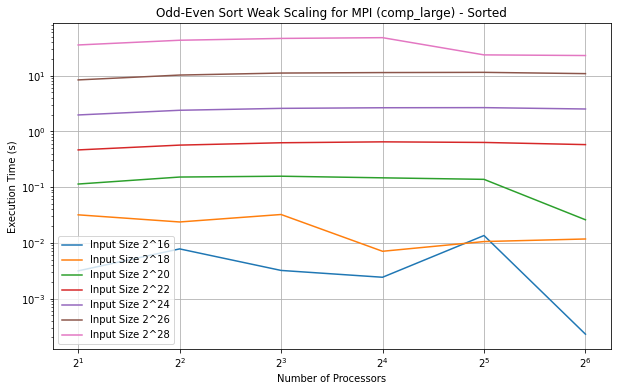

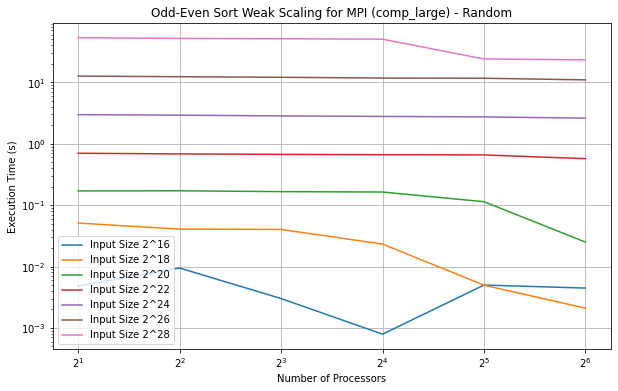

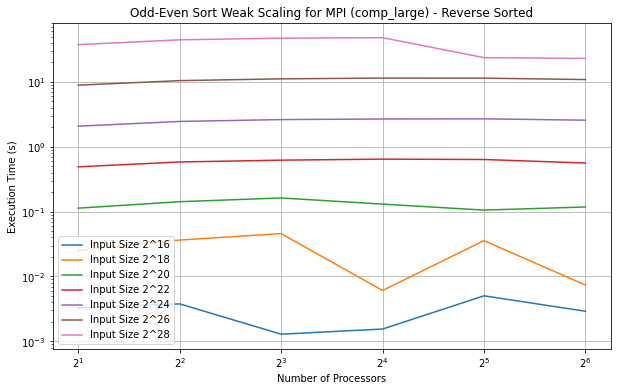

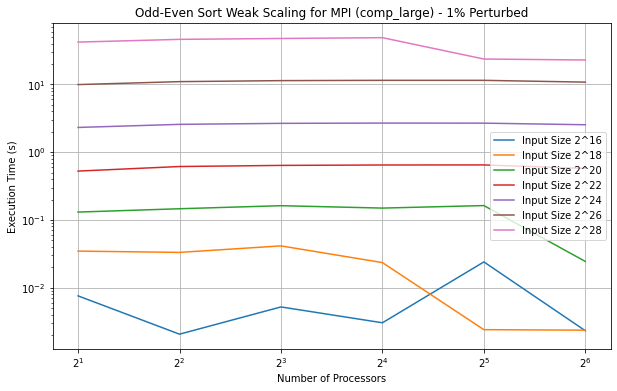

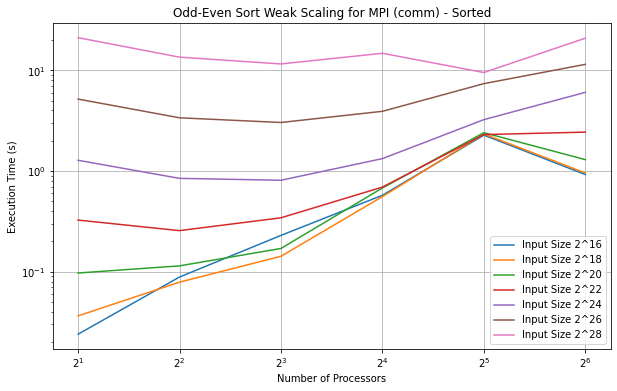

...

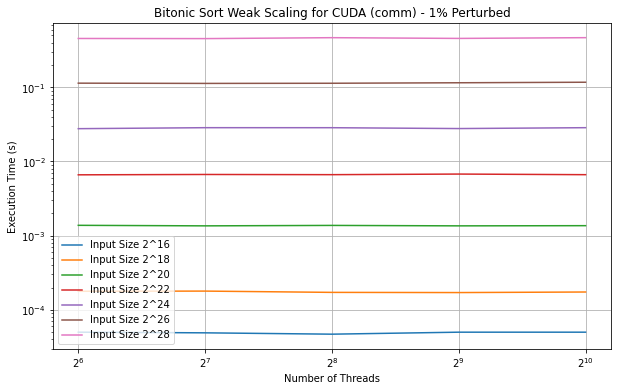

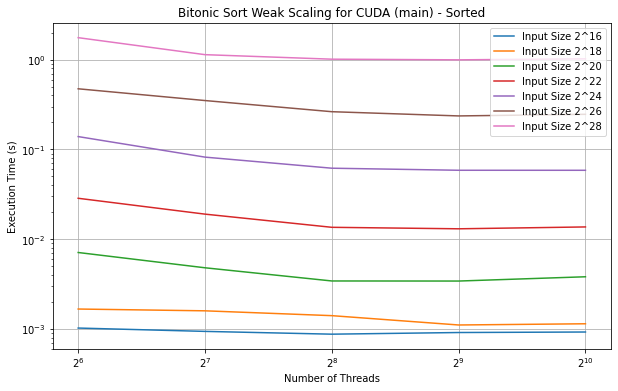

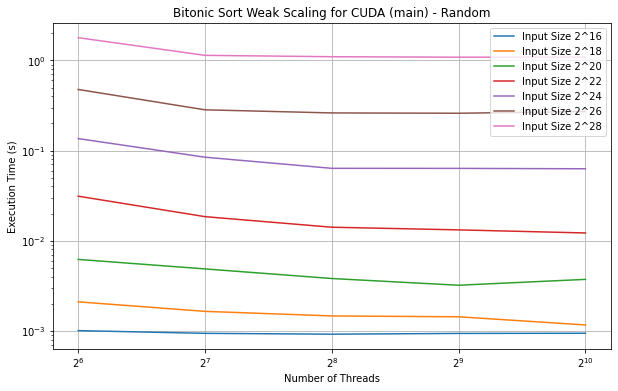

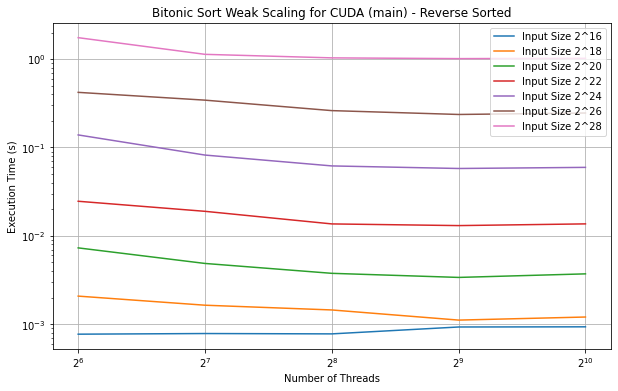

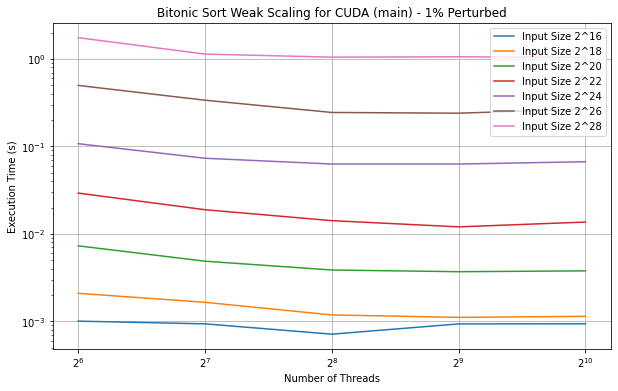

In [27]:
for algorithm in cali_dict.keys():
    for implementation in implementations:
        for region in regions:
            for input_type in input_types:
                plot_weak_scaling(merged_df_dict[algorithm], input_type, implementation, region, algorithm)

Define Aggregate Graphs

In [39]:
def plot_comparative_scaling(merged_df_dict, input_size, input_type, region, model, plot_type='strong', min_procs_or_threads=1):
    plt.figure(figsize=(10, 6))
    exponent = int(math.log2(input_size))
    x_label = 'Number of Processors' if model == 'MPI' else 'Number of Threads'
    title_suffix = 'Strong Scaling' if plot_type == 'strong' else 'Weak Scaling'

    for algorithm, merged_df in merged_df_dict.items():
        x = 'num_procs' if model == 'MPI' else 'num_threads'
        timeLabel = ''
        if model == 'MPI':
            timeLabel = 'Avg time/rank'
        else:
            if algorithm == 'Bitonic':
                timeLabel = 'Avg GPU Time/rank'
            else:
                timeLabel = 'Avg GPU time/rank'
        
        if plot_type == 'strong':
            # Strong Scaling
            df_filtered = merged_df[(merged_df['ProgrammingModel'] == model) &
                                    (merged_df['InputSize'] == input_size) &
                                    (merged_df['name'] == region) &
                                    (merged_df['InputType'] == input_type) &
                                    (merged_df[x] > min_procs_or_threads)]
        else:
            # Weak Scaling
            df_filtered = merged_df[(merged_df['ProgrammingModel'] == model) &
                                    (merged_df['name'] == region) &
                                    (merged_df['InputType'] == input_type) &
                                    (merged_df[x] > min_procs_or_threads)]

        grouped = df_filtered.groupby(x)[timeLabel].mean()

        if not grouped.empty:
            plt.plot(grouped.index, grouped.values, label=f'{algorithm}')

    plt.xscale('log', base=2)
    plt.xlabel(x_label)
    plt.yscale('log', base=10)
    plt.ylabel('Execution Time (s)')
    plt.title(f'Comparative {title_suffix} for {model} ({region}) with Input Size 2^{exponent} - {input_type}')
    plt.legend()
    plt.grid(True)
    plt.savefig(f'./Plots/comparative_{plot_type}_scaling_{input_size}_{model}_{region}_{input_type}.png')
    plt.show()

Plot Aggregate Graphs

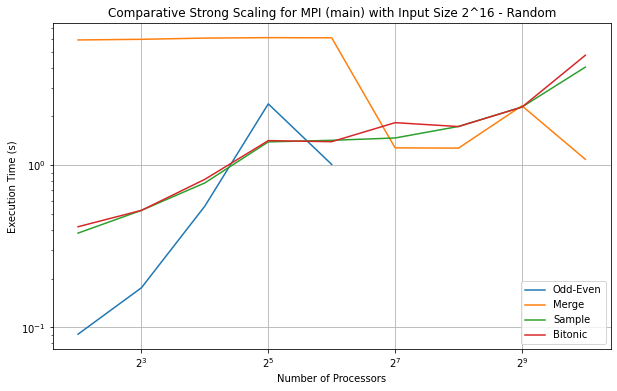

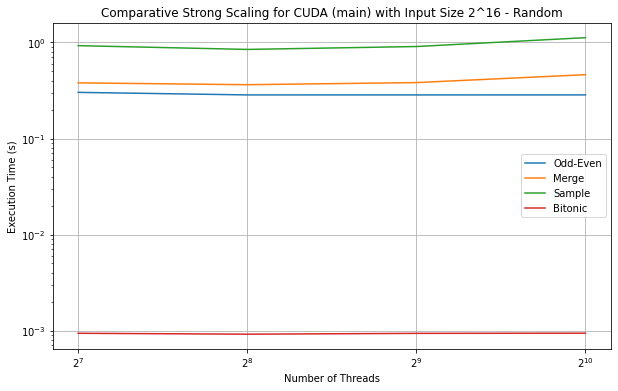

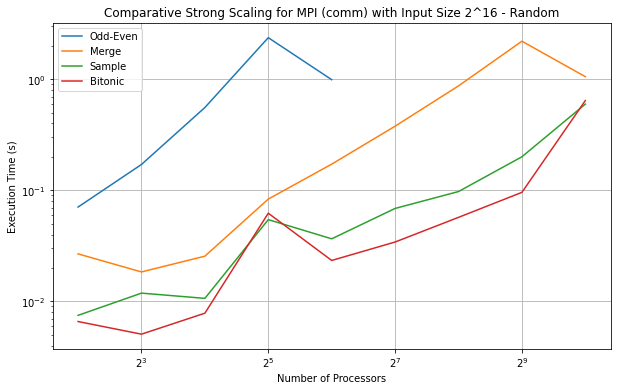

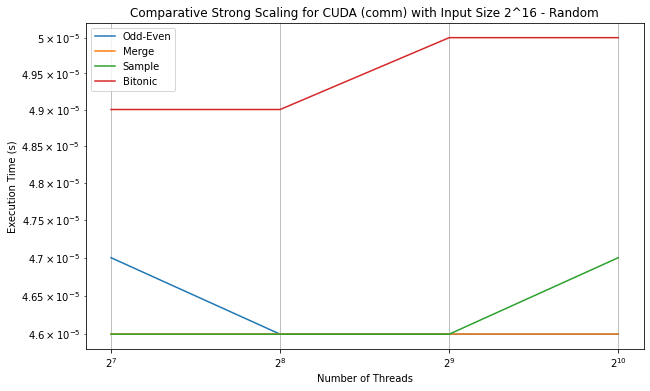

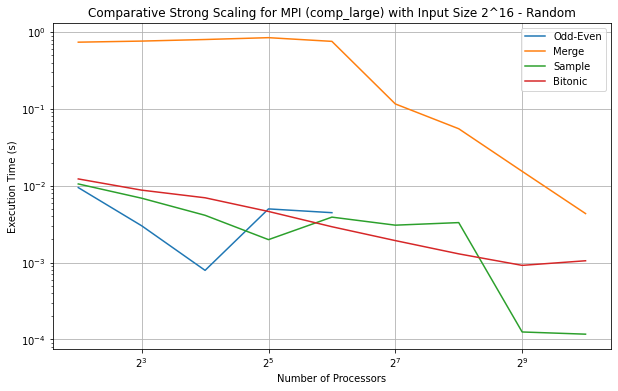

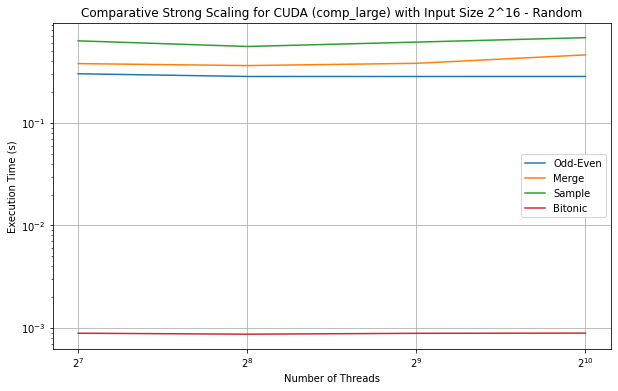

In [40]:
plot_comparative_scaling(merged_df_dict, 2**16, 'Random', 'main', 'MPI', plot_type='strong', min_procs_or_threads=2)
plot_comparative_scaling(merged_df_dict, 2**16, 'Random', 'main', 'CUDA', plot_type='strong', min_procs_or_threads=64)
plot_comparative_scaling(merged_df_dict, 2**16, 'Random', 'comm', 'MPI', plot_type='strong', min_procs_or_threads=2)
plot_comparative_scaling(merged_df_dict, 2**16, 'Random', 'comm', 'CUDA', plot_type='strong', min_procs_or_threads=64)
plot_comparative_scaling(merged_df_dict, 2**16, 'Random', 'comp_large', 'MPI', plot_type='strong', min_procs_or_threads=2)
plot_comparative_scaling(merged_df_dict, 2**16, 'Random', 'comp_large', 'CUDA', plot_type='strong', min_procs_or_threads=64)